NOTE: to run the notebook you need to change the path to the measured statistics (`Pk_true`, `Pk_int`, and `Bk_int`) in `outbox-all-fs-RSD-LH.csv` and `inbox-all-fs-RSD-LH.csv` to the path on your machine.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import sys
sys.path.append("../src/training/")
import NoInterNet_model as NIN
import NoInterNet_fraction_model as NINf

import torch

from torch.utils.data import DataLoader
from torch import nn

from plotting_results import *

In [2]:
from matplotlib.pyplot import rc
import matplotlib.font_manager
rc('font',**{'size':'22','family':'serif','serif':['CMU serif']})
rc('mathtext', **{'fontset':'cm'})
rc('text', usetex=True)
rc('legend',**{'fontsize':'18'})
matplotlib.rcParams['axes.linewidth'] = 1.5
matplotlib.rcParams['axes.labelsize'] = 20
matplotlib.rcParams['xtick.labelsize'] = 15
matplotlib.rcParams['ytick.labelsize'] = 15
matplotlib.rcParams['legend.fontsize'] = 15
#matplotlib.rcParams['legend.title_fontsize'] = 25
matplotlib.rcParams['xtick.major.size'] = 5
matplotlib.rcParams['ytick.major.size'] = 5
matplotlib.rcParams['xtick.minor.size'] = 2.5
matplotlib.rcParams['ytick.minor.size'] = 2.5
matplotlib.rcParams['xtick.major.width'] = 1.5
matplotlib.rcParams['ytick.major.width'] = 1.5
matplotlib.rcParams['xtick.minor.width'] = 1.5
matplotlib.rcParams['ytick.minor.width'] = 1.5
matplotlib.rcParams['axes.titlesize'] = 30
matplotlib.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Running on", device)

Running on cpu


Network input: $$P_{\rm inter}(k)/{\rm max}(P_{\rm inter}(k))$$
Network label: $$y(k) = \frac{P_{\rm true}(k)}{P_{\rm inter}(k)}$$
Network corrected power spectrum: $$P_{\rm corrected}(k) = y_{\rm pred}(k) \, P_{\rm inter}(k)$$
Relative error before correction: $$\frac{P_{\rm true}(k) - P_{\rm inter}(k)}{P_{\rm true}(k)} = 1 - \frac{P_{\rm inter}(k)}{P_{\rm true}(k)} = 1 - \frac{1}{y(k)}$$
Relative error after correction: $$\frac{P_{\rm true}(k) - P_{\rm corrected}(k)}{P_{\rm true}(k)} = 1 - \frac{P_{\rm corrected}(k)}{P_{\rm true}(k)} = 1 - \frac{P_{\rm corrected}(k)}{P_{\rm inter}(k)} \frac{P_{\rm inter}(k)}{P_{\rm true}(k)} = 1 - \frac{y_{\rm pred}(k)}{y_(k)}$$

Moment network loss
$$ loss = \log ({\rm MSE}(correction, y_{\rm correction})) + \log ({\rm MSE}(f, y_f)) + \log ({\rm MSE}(\sigma_{\rm correction}^2, (correction - y_{\rm correction})^2)) + \log ({\rm MSE}(\sigma_{f}^2, (f - y_{f})^2)) \, , $$
where, $y_{*}$ is the label of the $correction$ or $f$ and 
$$ {\rm MSE}(a,b) = \frac{1}{N} \sum^N (a-b)^2 \, .$$

# Outbox

## P0 -> P0

### 0 Planck

In [4]:
Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 0. #0 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 0. #0 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

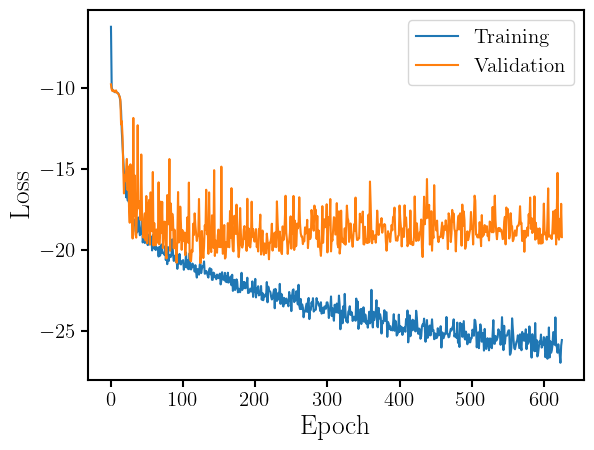

In [5]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/")

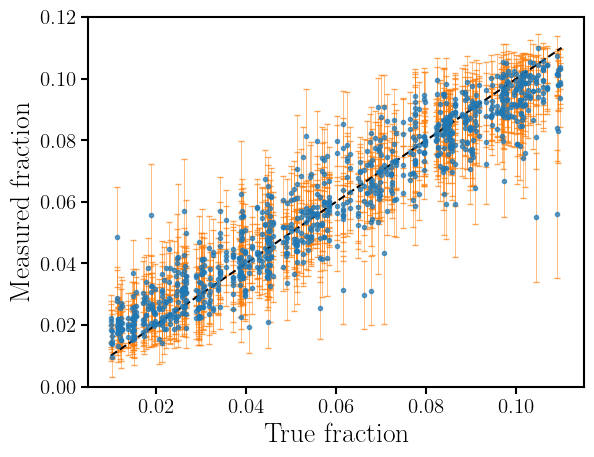

MSE error: 8.6354376e-05


In [6]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-LH-knowcosmo.png')

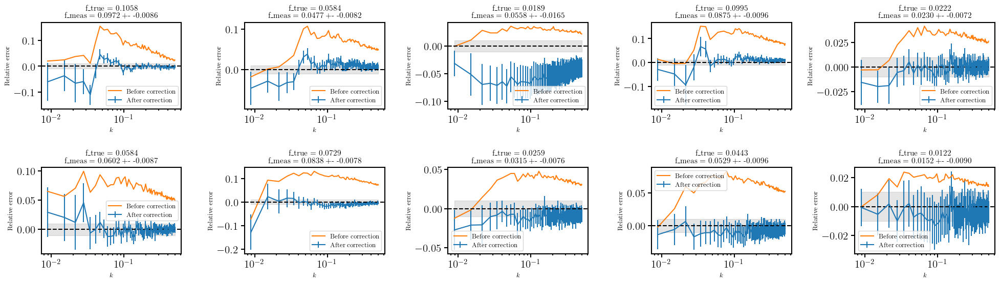

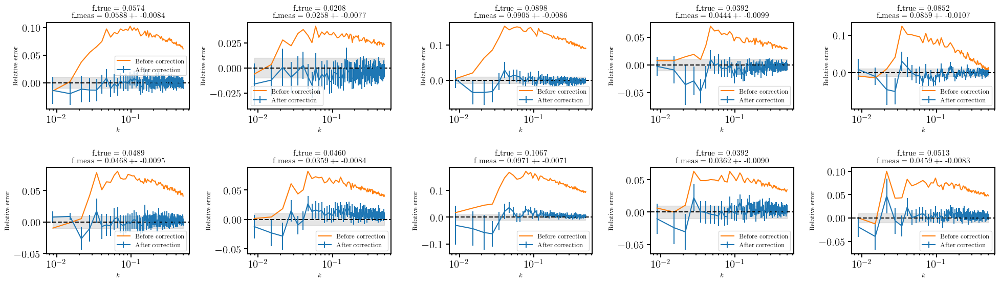

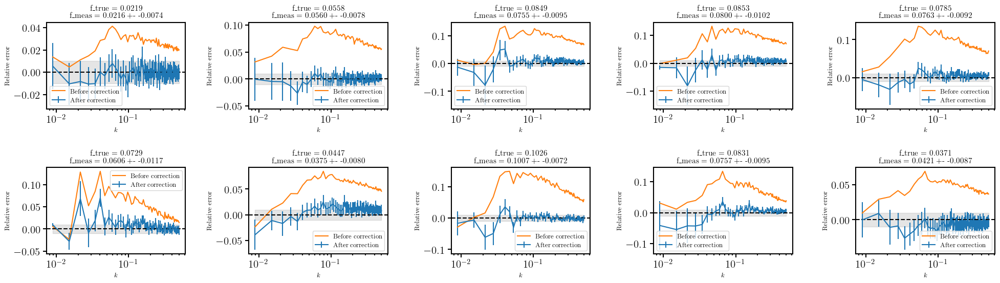

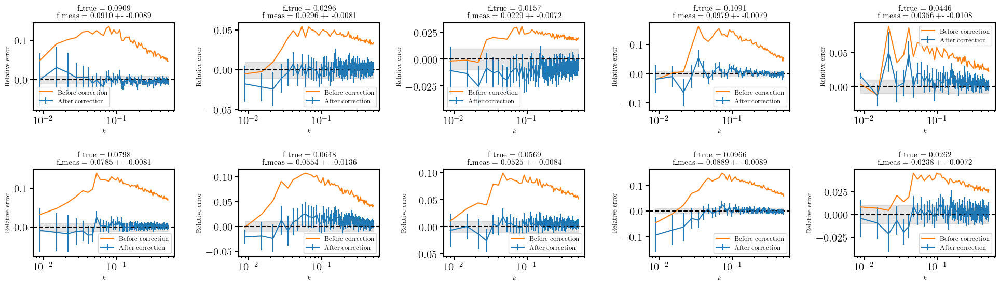

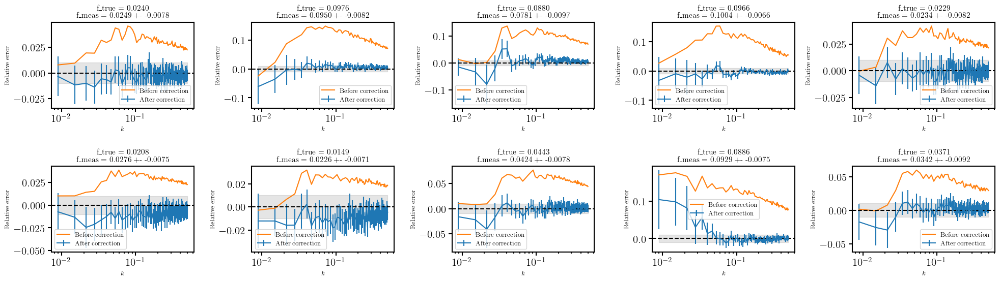

In [7]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 5 Planck

In [8]:
Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 5. #5 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 5. #5 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

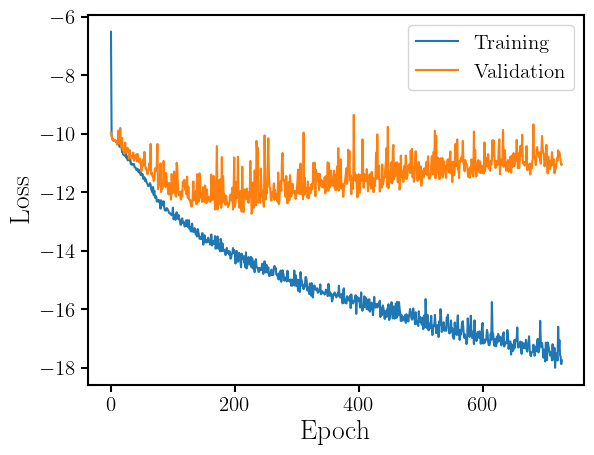

In [9]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/")

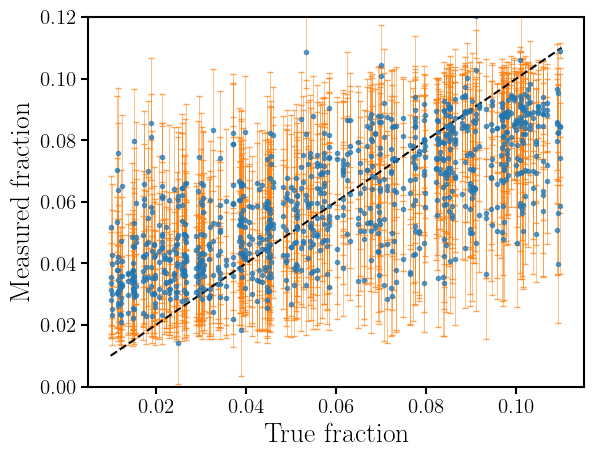

MSE error: 0.00042830736


In [10]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-LH-5P.png')

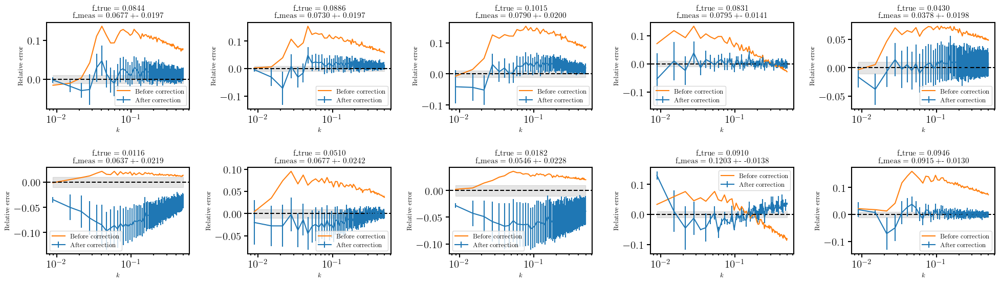

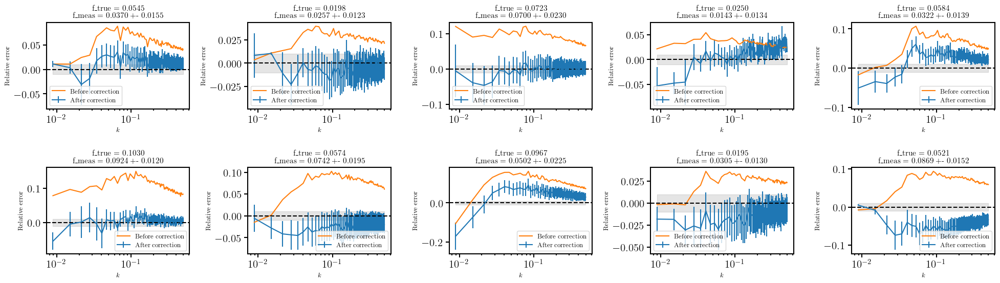

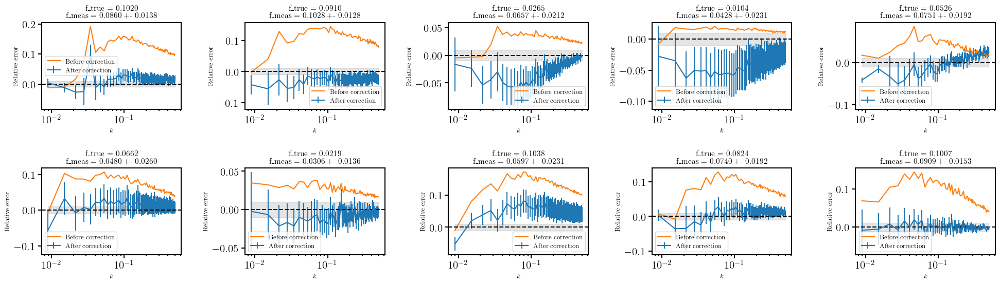

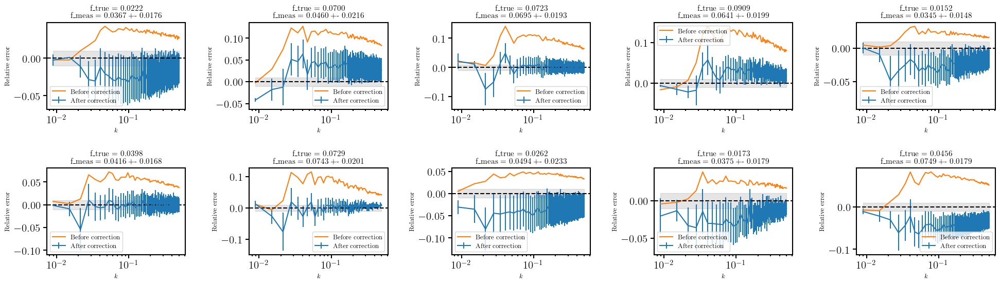

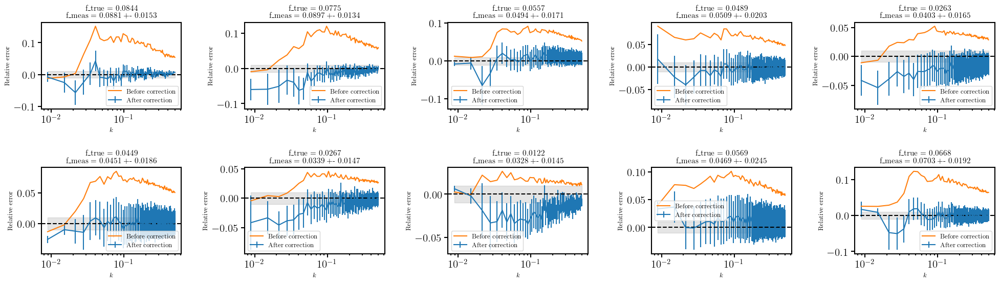

In [11]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 3 Planck

In [12]:
Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 3. #3 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 3. #3 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

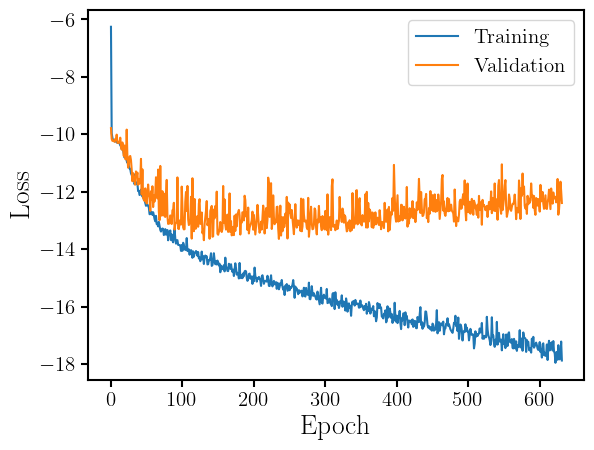

In [13]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/")

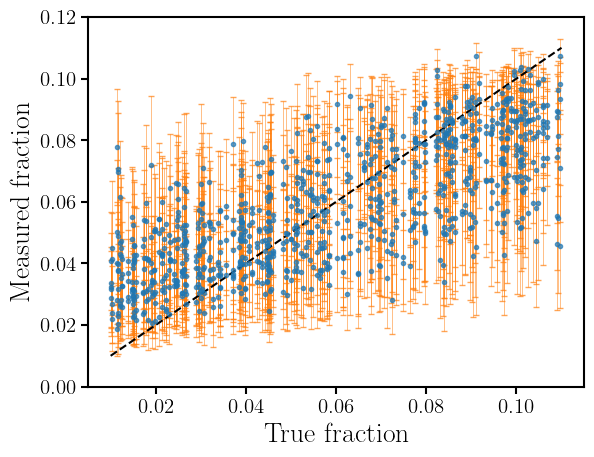

MSE error: 0.00038839682


In [14]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-LH-3P.png')

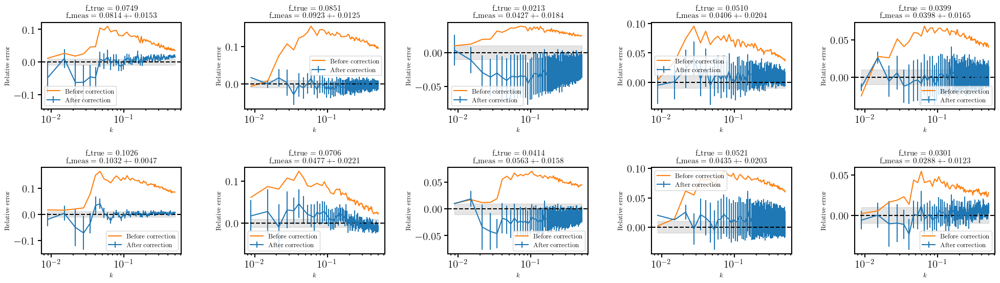

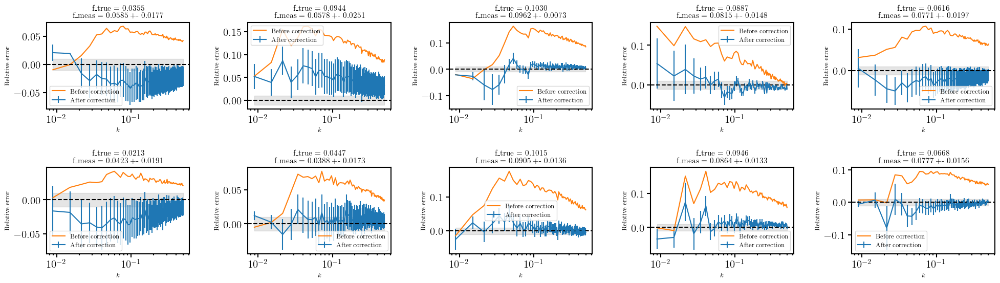

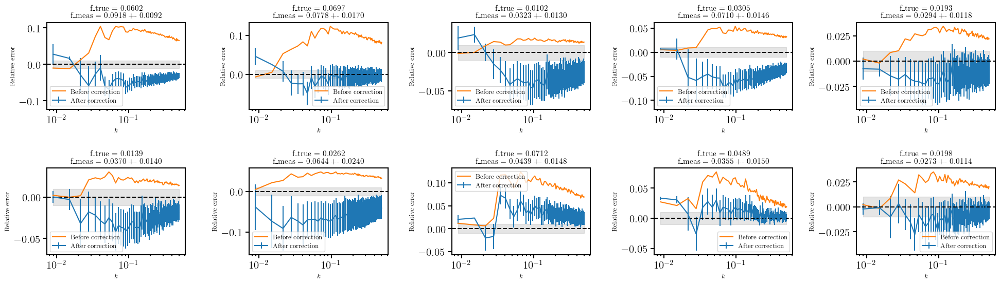

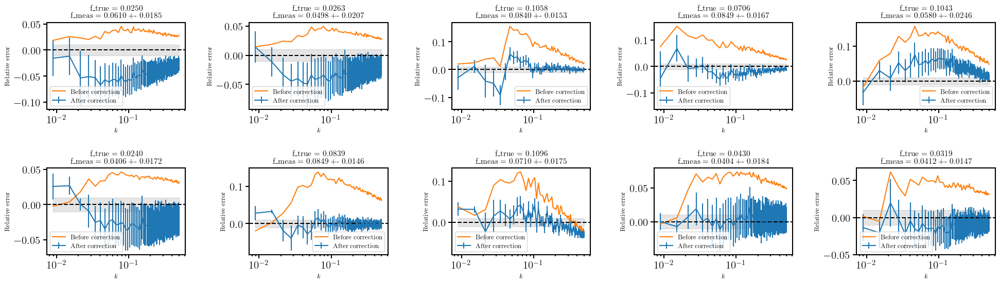

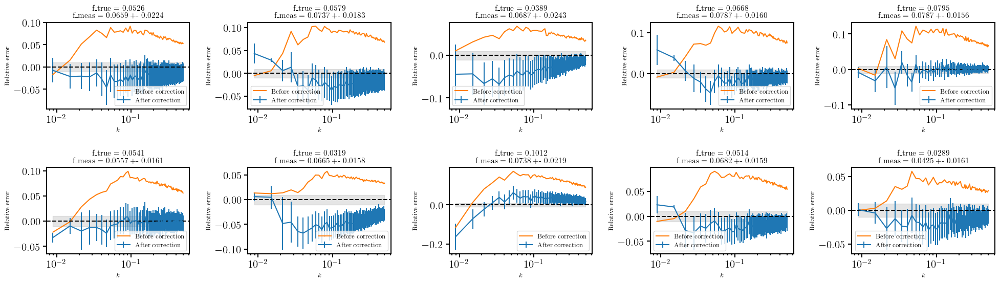

In [15]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 1 Planck

In [16]:
Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 1. #1 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 1. #1 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

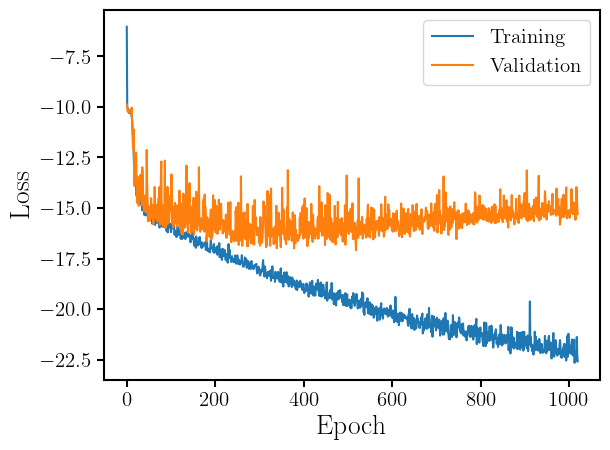

In [17]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/")

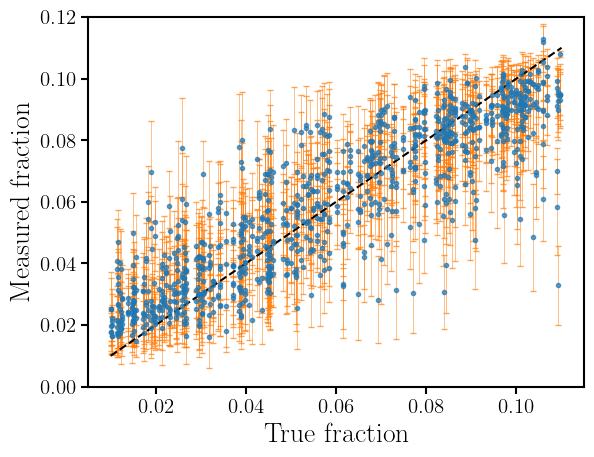

MSE error: 0.00020541572


In [18]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-LH-1P.png')

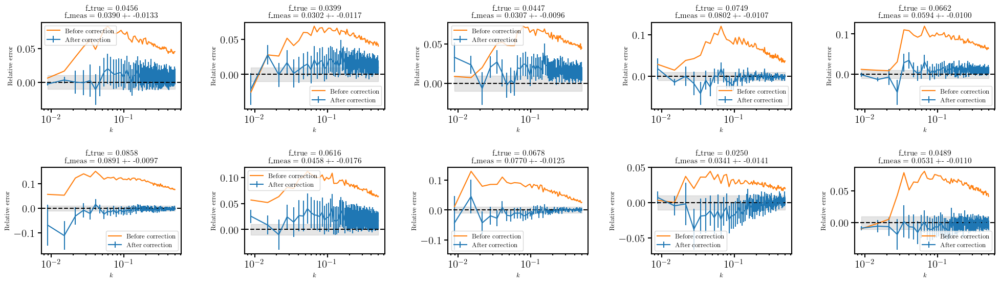

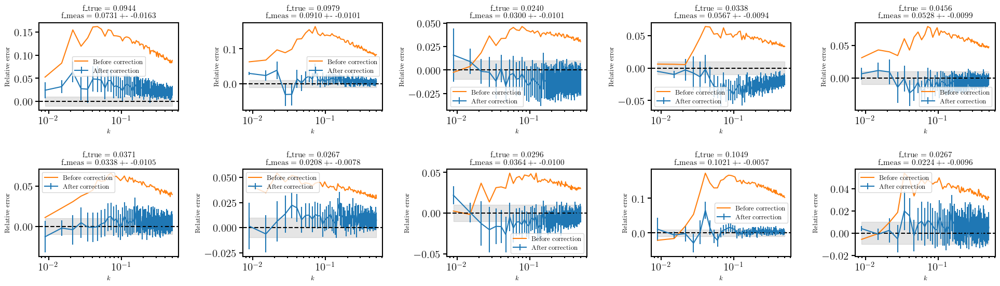

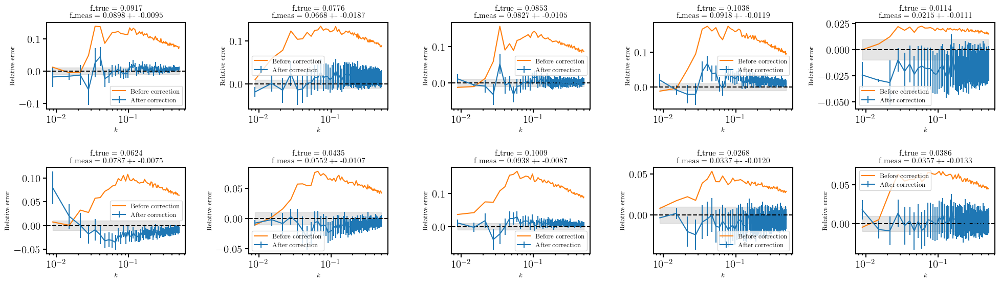

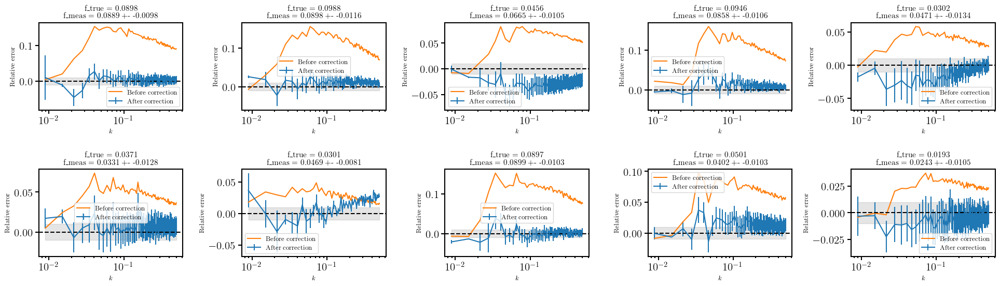

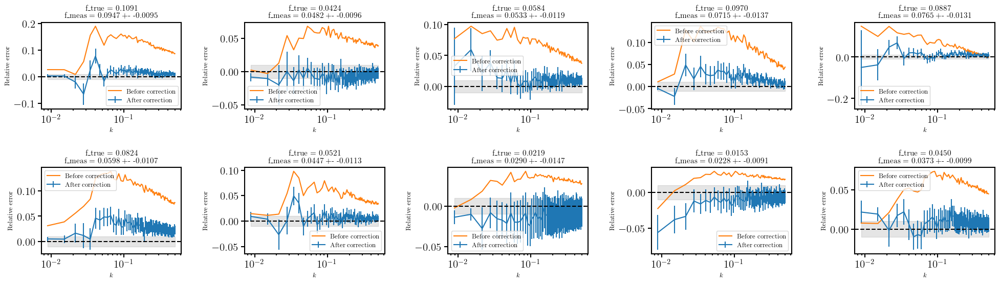

In [19]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

## P0 B0 -> P0

### 0 Planck

In [20]:
PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(PBs), len_priors))
cosmo_p = np.zeros((len(PBs), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 0. #0 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 0. #0 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

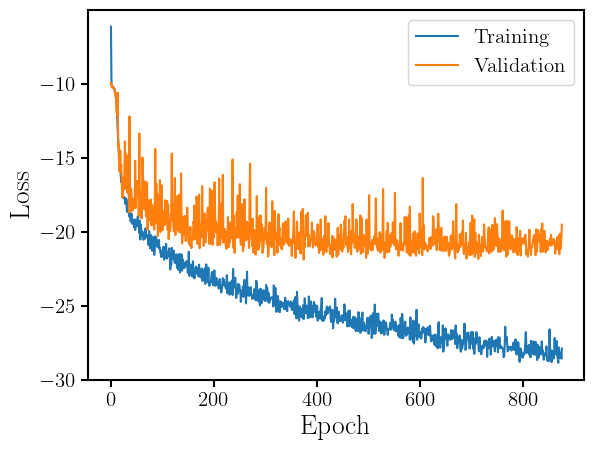

In [21]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/")

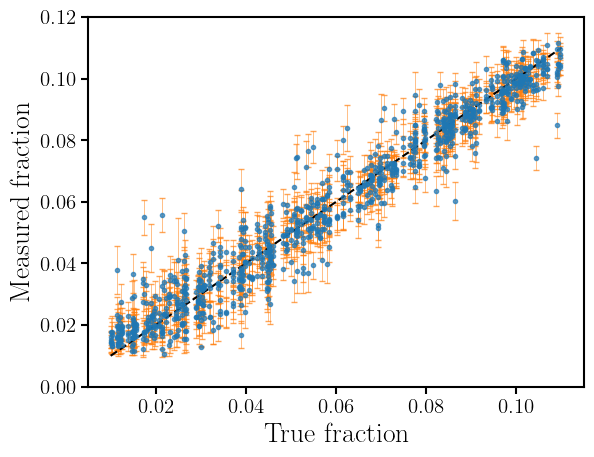

MSE error: 4.78568e-05


In [22]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-P0B0-LH-knowcosmo.png')

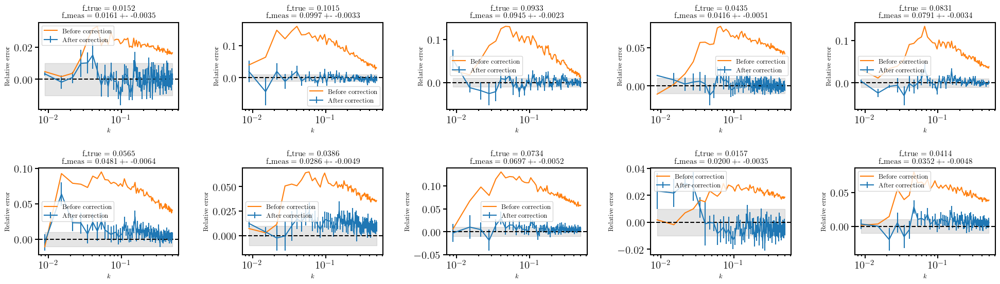

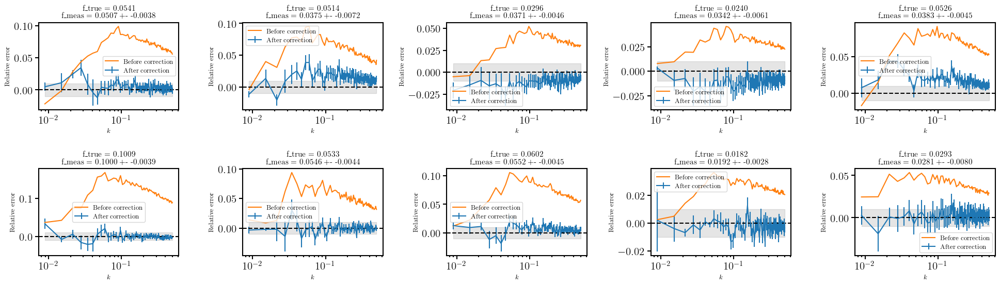

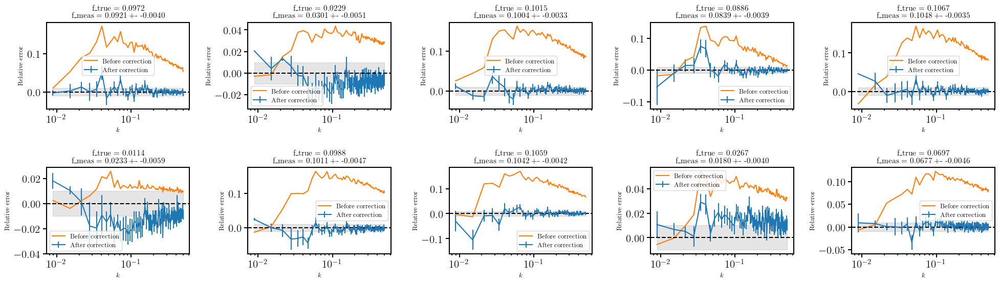

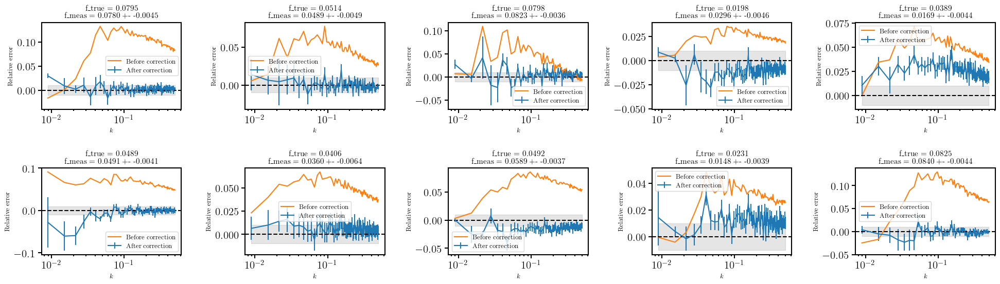

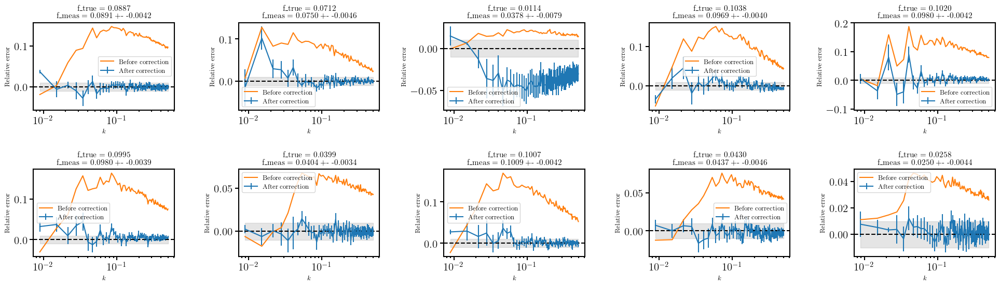

In [23]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 5 Planck

In [24]:
PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(PBs), len_priors))
cosmo_p = np.zeros((len(PBs), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 5. #5 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 5. #5 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

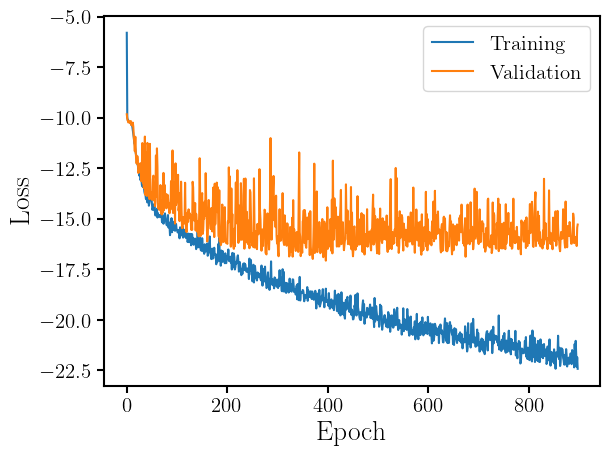

In [25]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/")

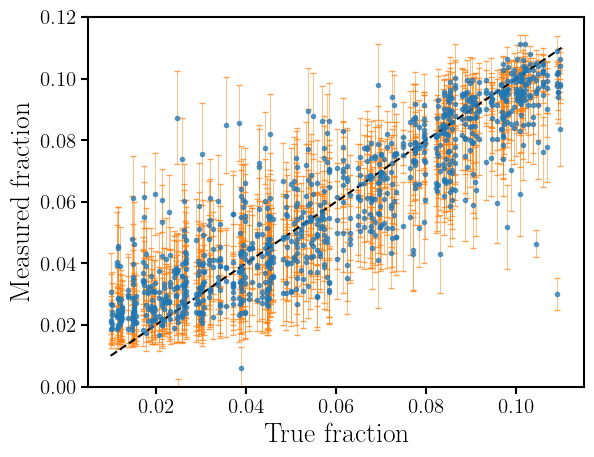

MSE error: 0.00017758632


In [26]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-P0B0-LH-5P.png')

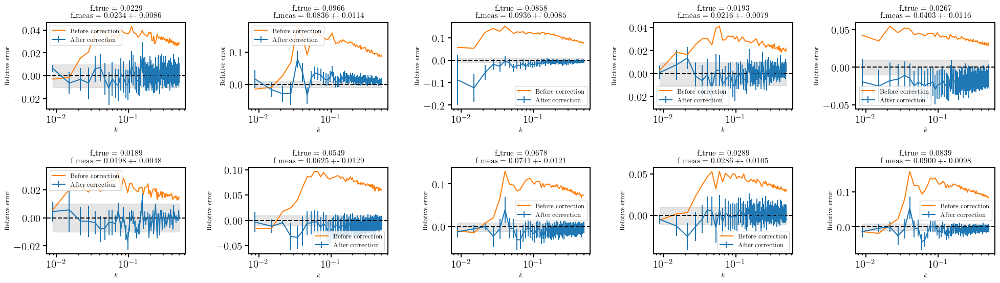

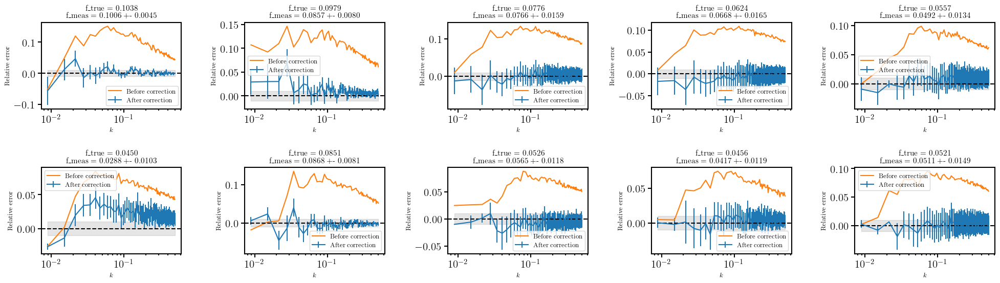

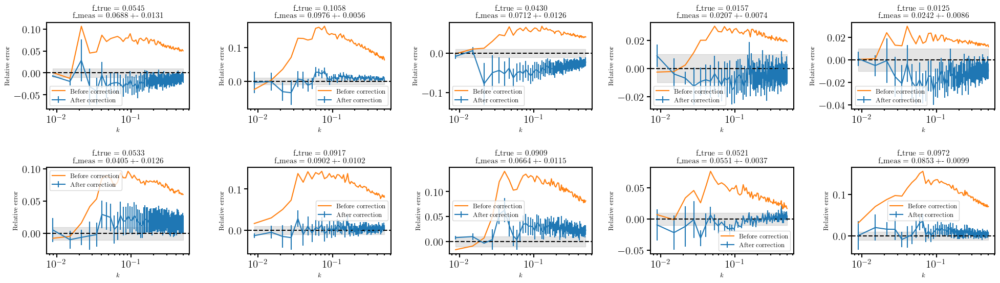

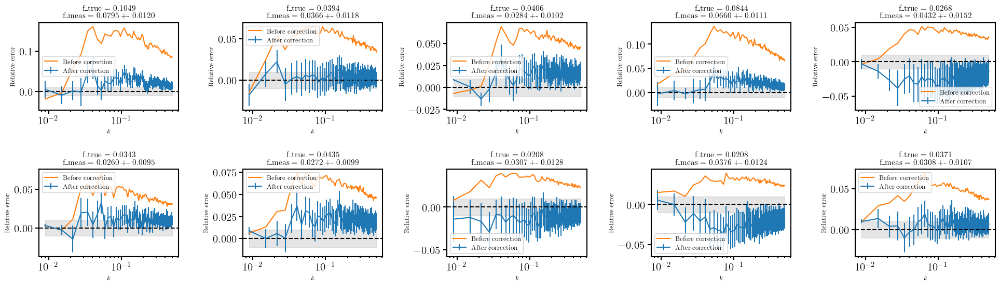

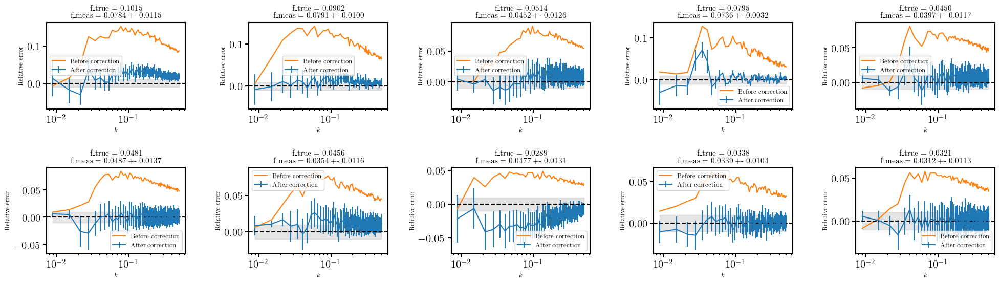

In [27]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 3 Planck

In [28]:
PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(PBs), len_priors))
cosmo_p = np.zeros((len(PBs), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 3. #3 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 3. #3 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

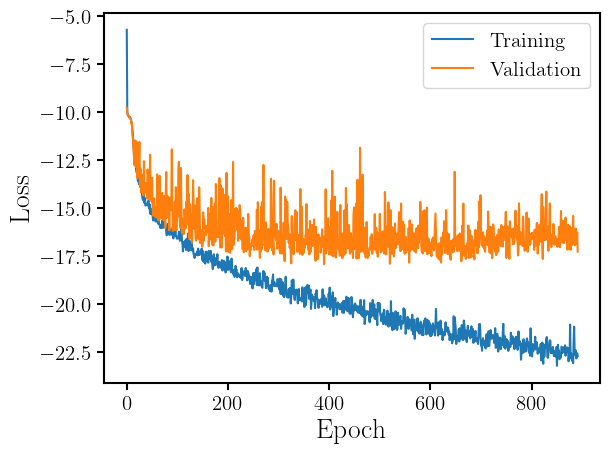

In [29]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/")

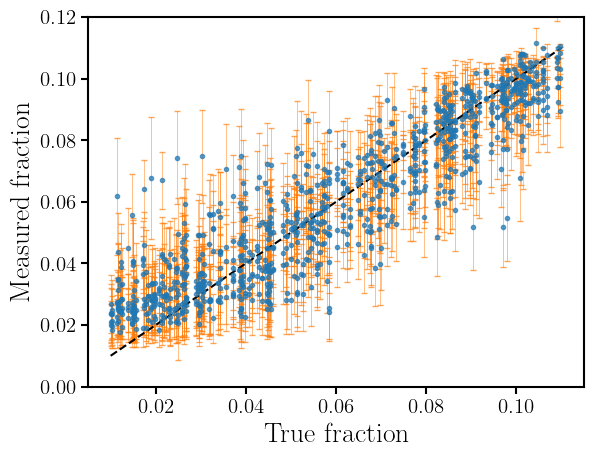

MSE error: 0.00014764124


In [30]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-P0B0-LH-3P.png')

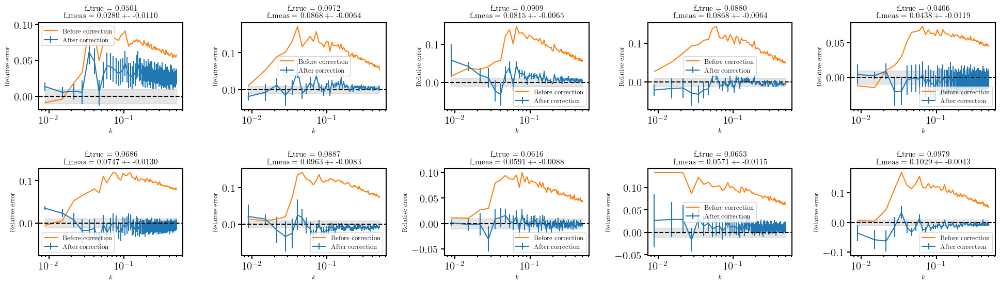

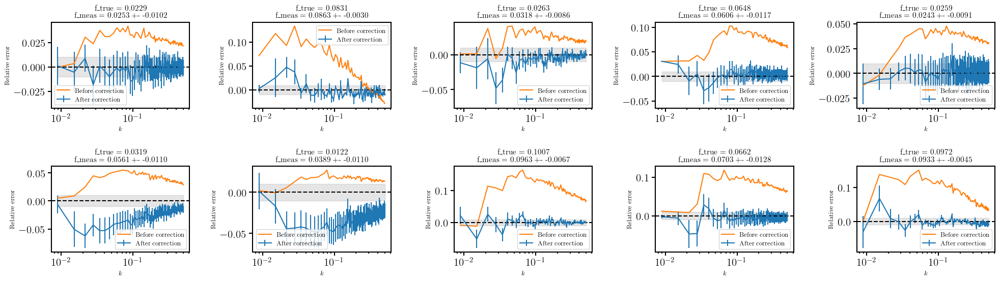

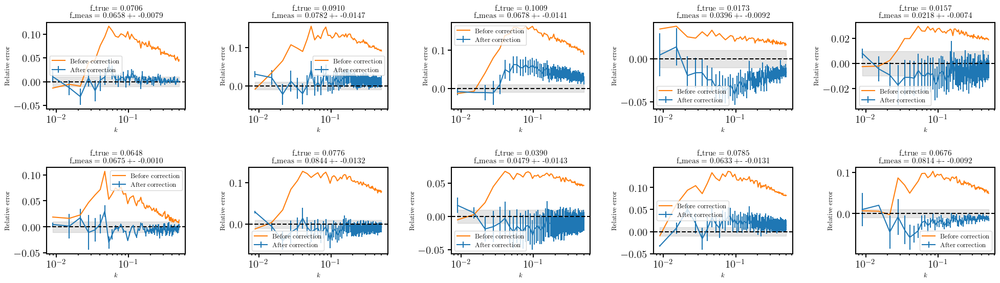

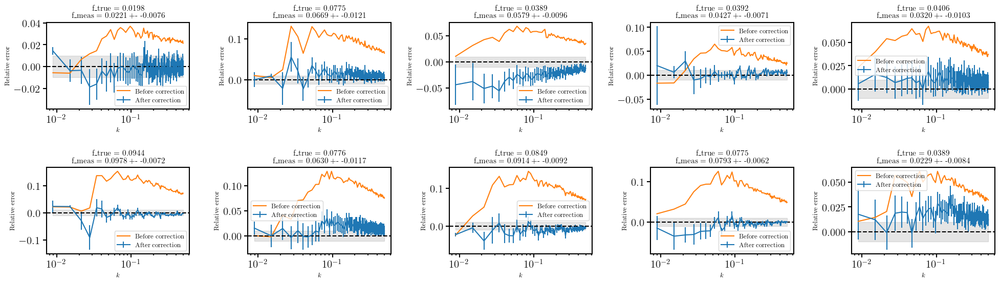

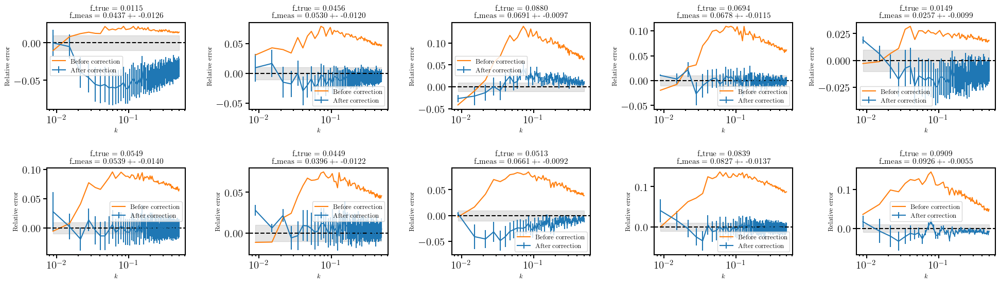

In [31]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 1 Planck

In [32]:
PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("outbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("outbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(PBs), len_priors))
cosmo_p = np.zeros((len(PBs), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 1. #1 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 1. #1 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

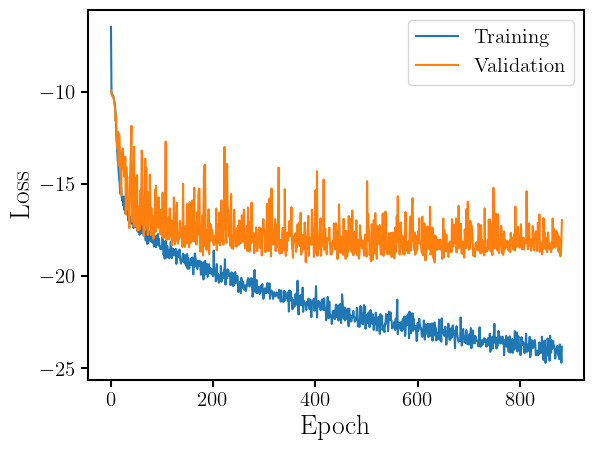

In [33]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/outbox-1321.00-iz1/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/")

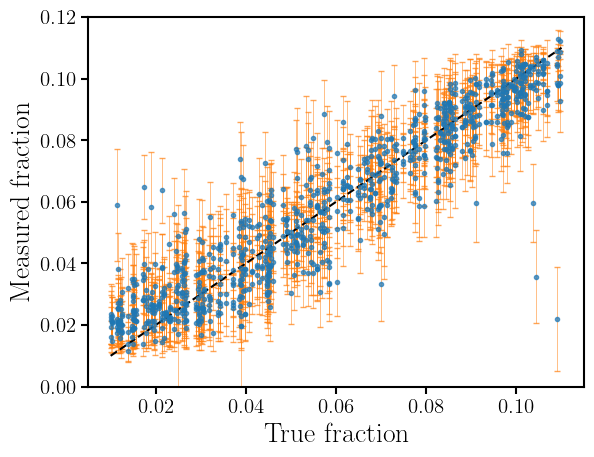

MSE error: 0.00011113164


In [34]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True)#, save='../figures/outbox-scatter-fraction-P0B0-LH-1P.png')

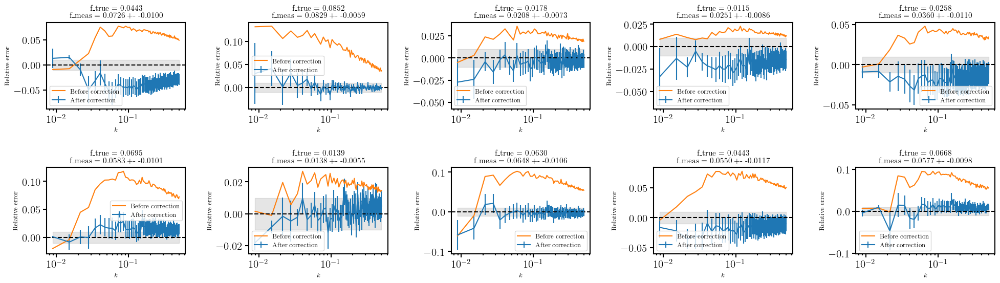

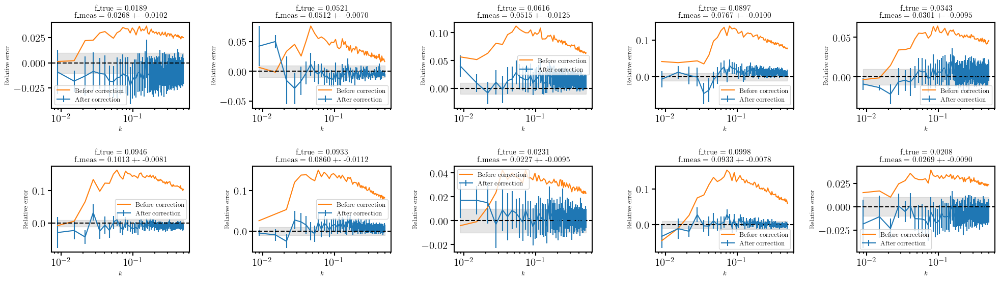

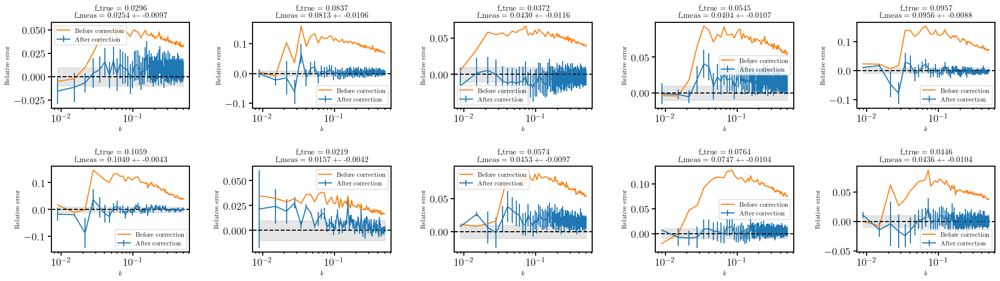

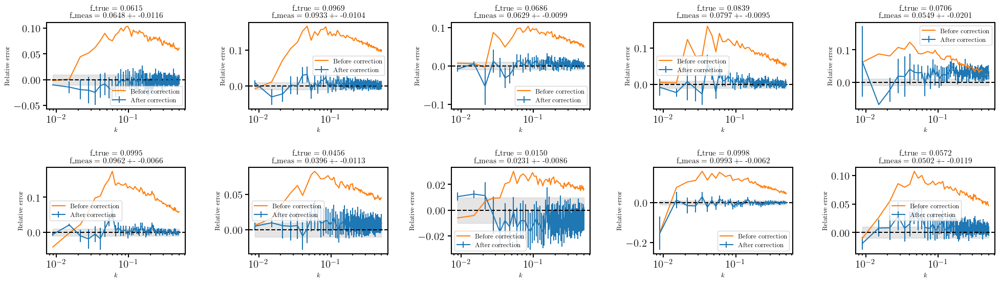

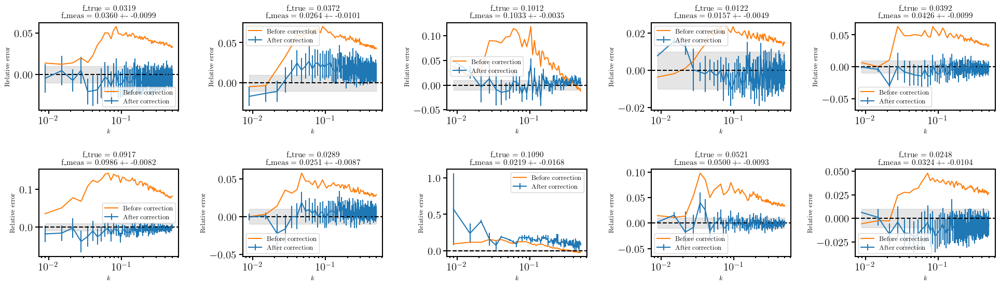

In [35]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

# Inbox

## P0 -> P0

### 0 Planck

In [36]:
Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 0. #0 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 0. #0 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

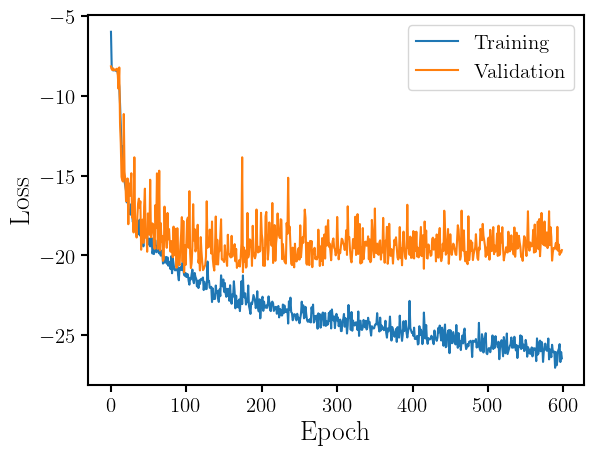

In [37]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior0P-allshift-moments/")

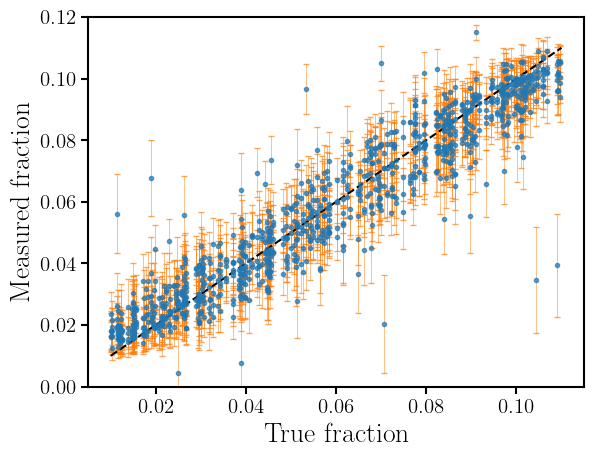

MSE error: 8.5615335e-05


In [38]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True, save=None)

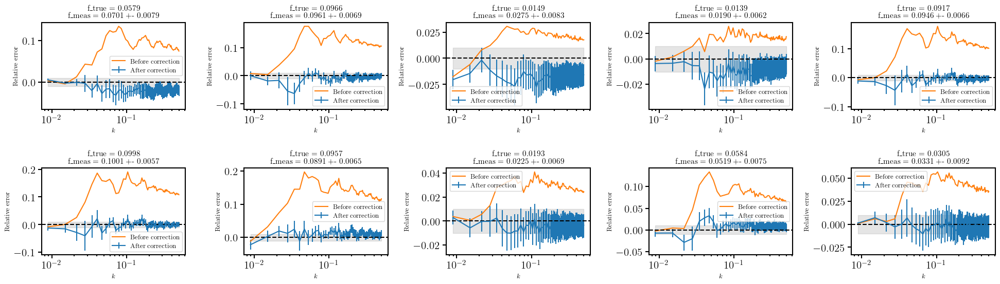

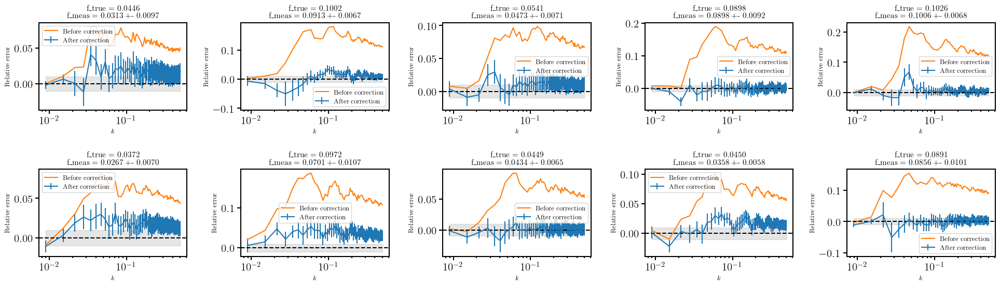

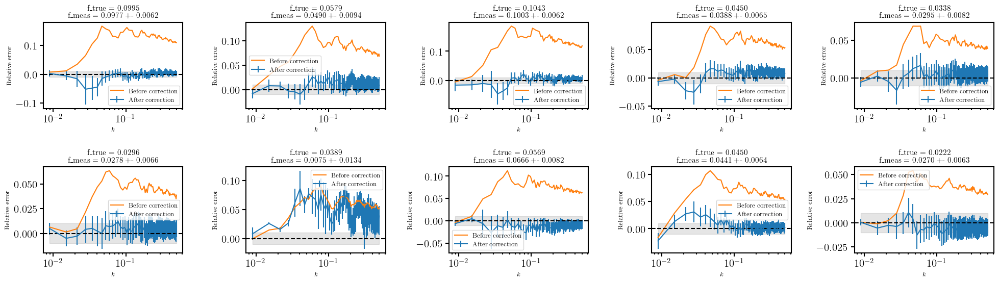

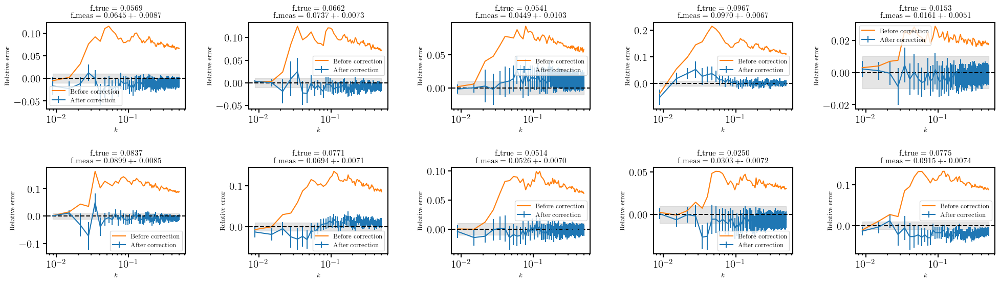

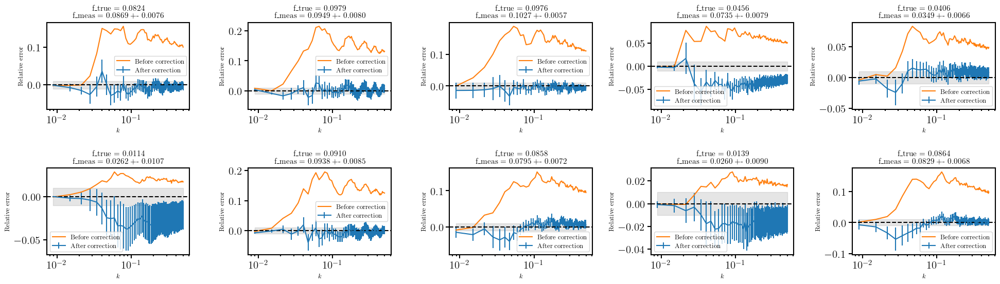

In [39]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 5 Planck

In [40]:
Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 5. #5 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 5. #5 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

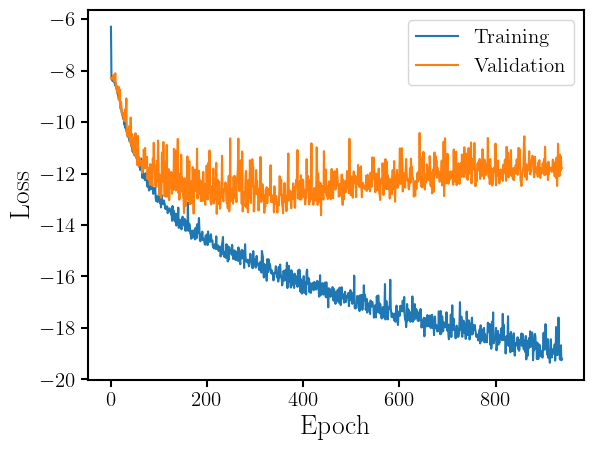

In [41]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior5P-allshift-moments/")

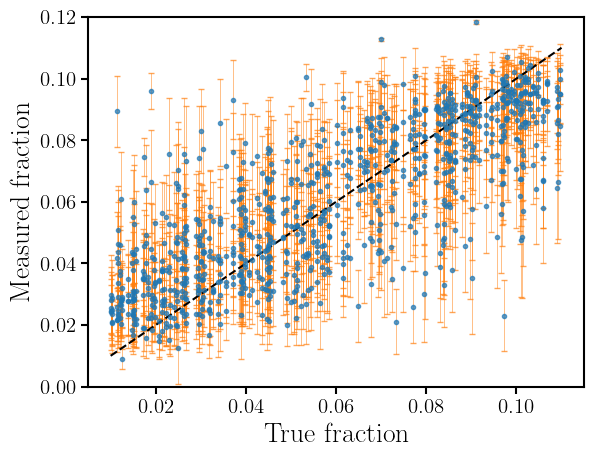

MSE error: 0.00032621488


In [42]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True, save=None)

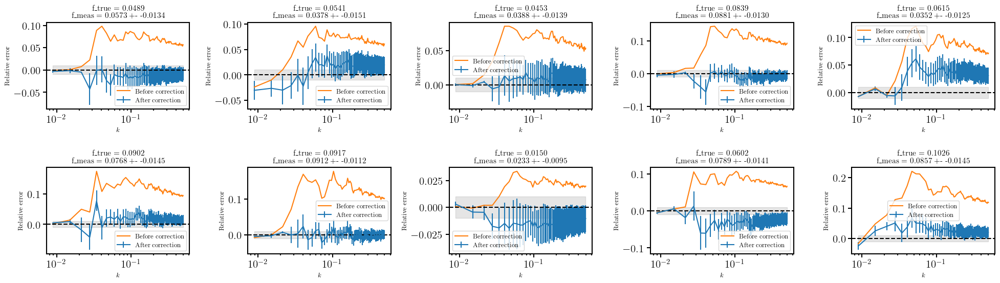

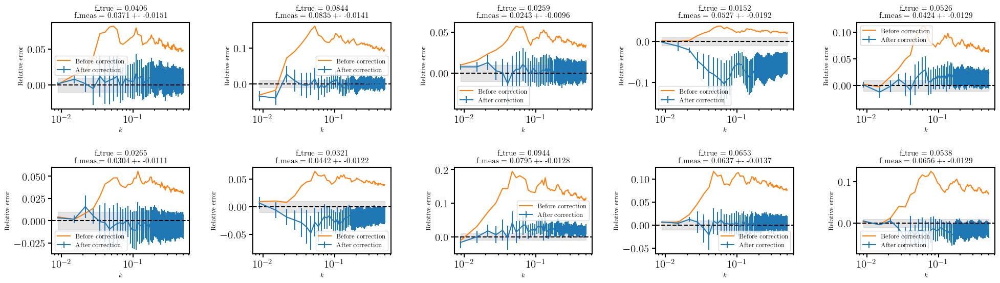

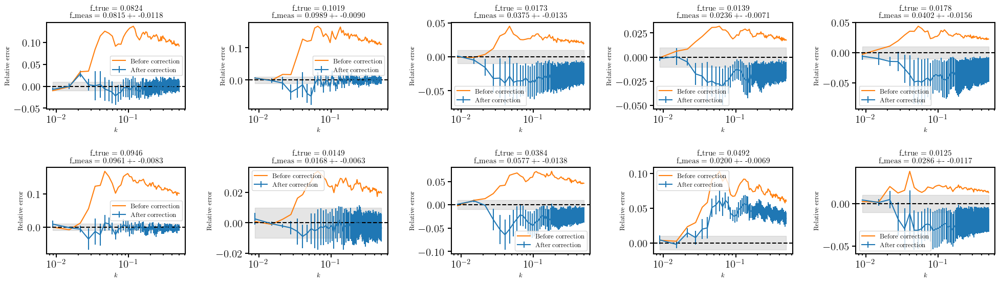

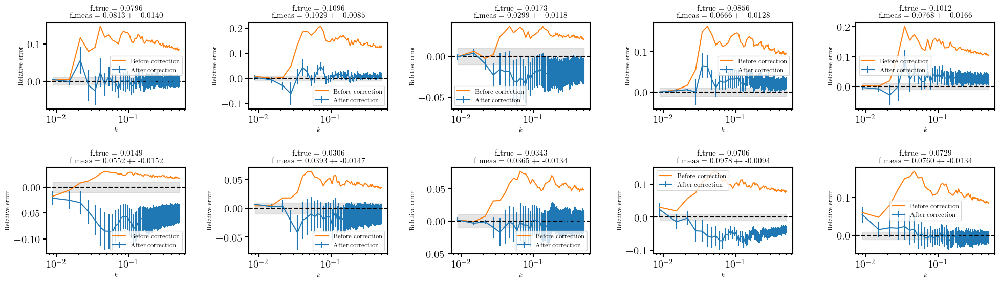

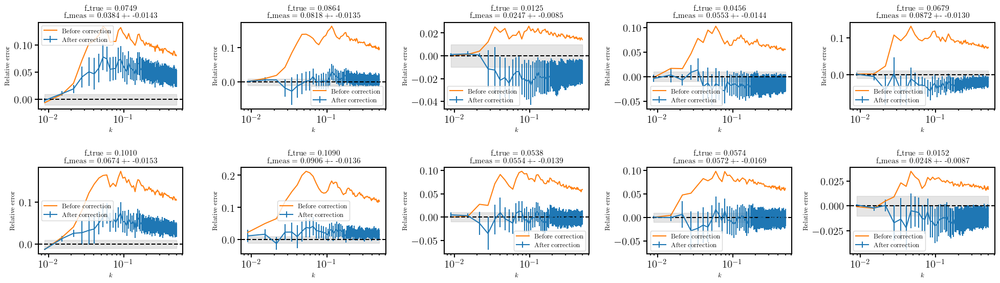

In [43]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 3 Plancks

In [44]:
Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 3. #3 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 3. #3 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

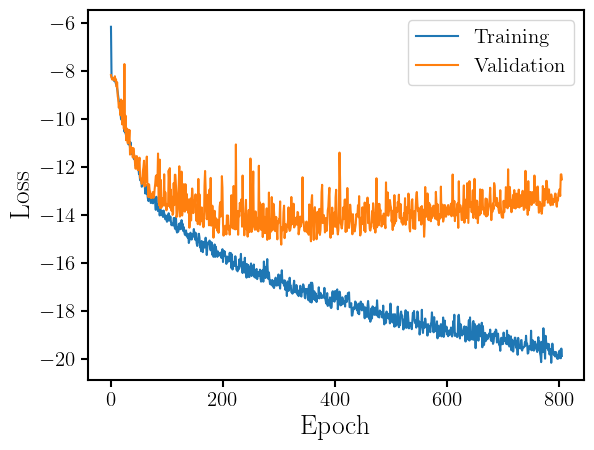

In [45]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior3P-allshift-moments/")

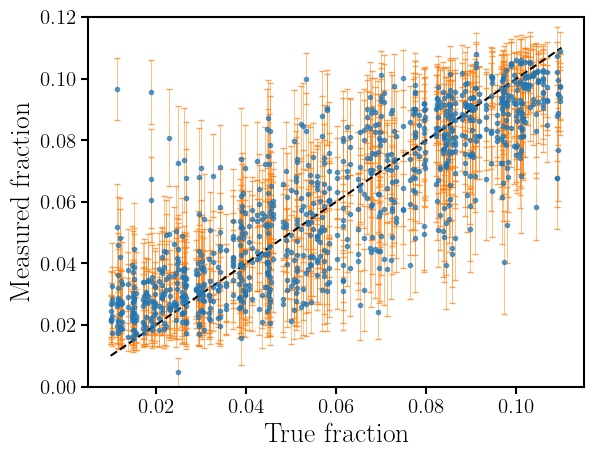

MSE error: 0.0002443259


In [46]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True, save=None)

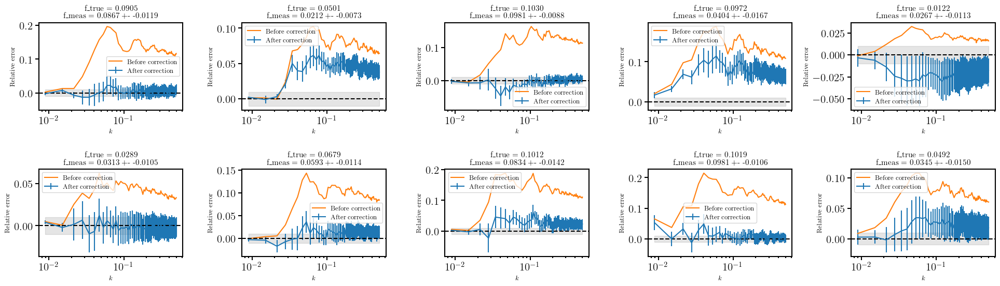

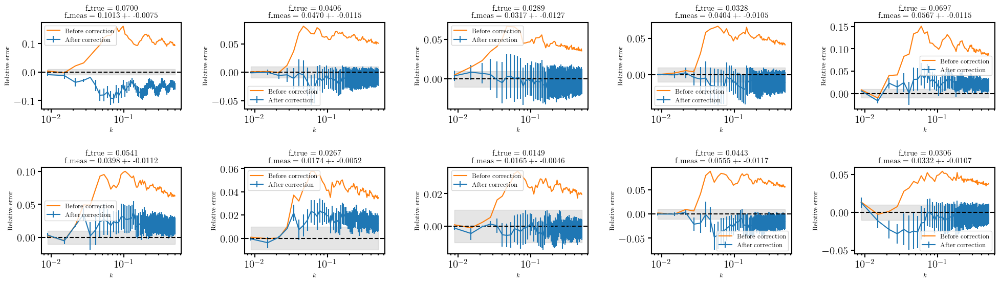

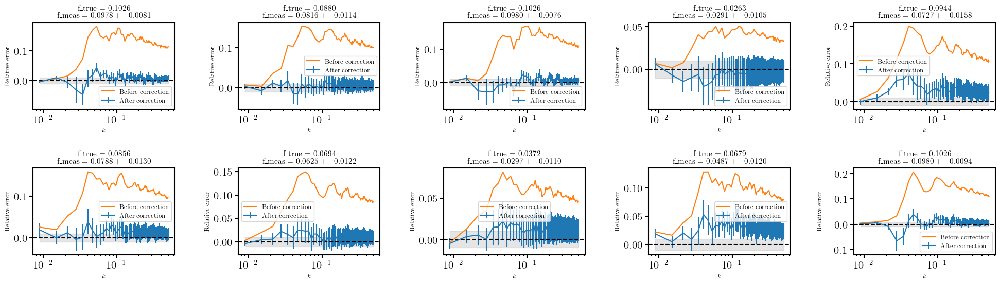

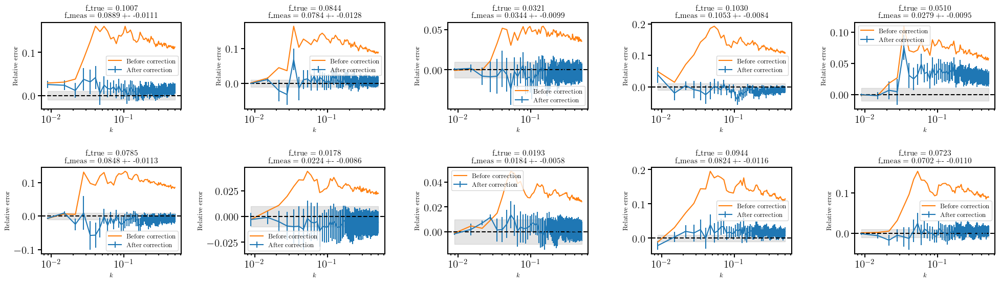

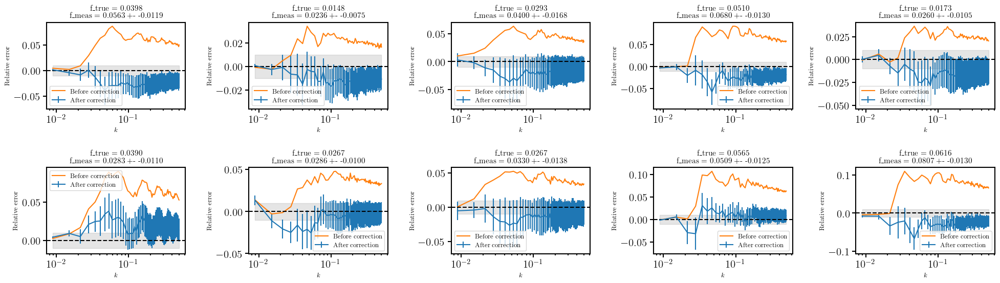

In [47]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 1 Planck

In [48]:
Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenk)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

Pks, labels, lenk = NINf.load_Pkf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 1. #1 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 1. #1 times Planck

Pks = np.hstack((Pks, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_Pks, max_Pks = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/maxmin.dat", unpack=True)
Pks = NINf.maxmin_corr(Pks, max_Pks, min_Pks)
norm = np.ones(len(Pks))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

Pks_test = Pks[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(Pks_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)

79


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

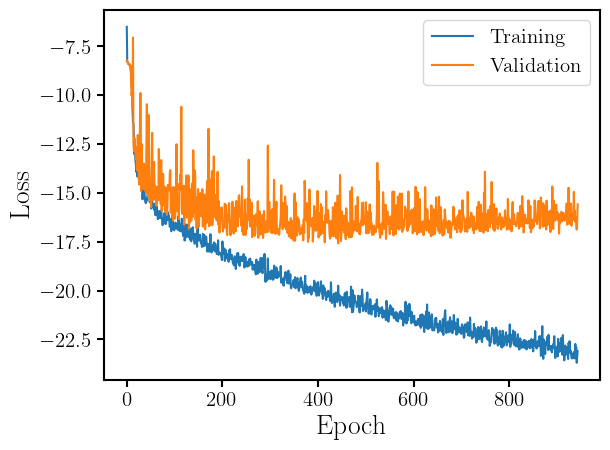

In [49]:
model = NINf.NoInterNet_fraction_compress_inference(lenk+5, 64, lenk, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0-P0-allprior1P-allshift-moments/")

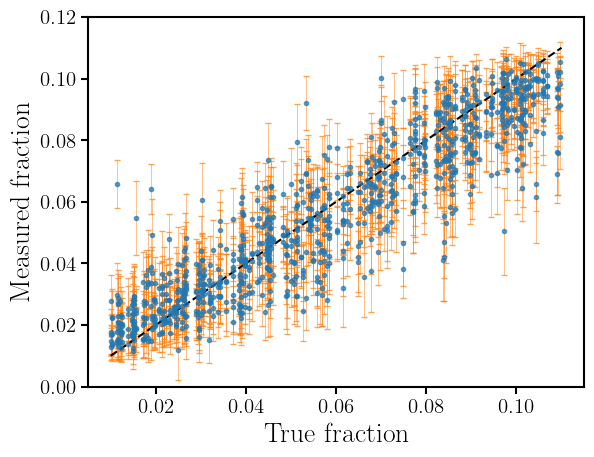

MSE error: 0.0001371334


In [50]:
plot_fraction(test, model, lenk=lenk, device=device, norm_fs=True, save=None)

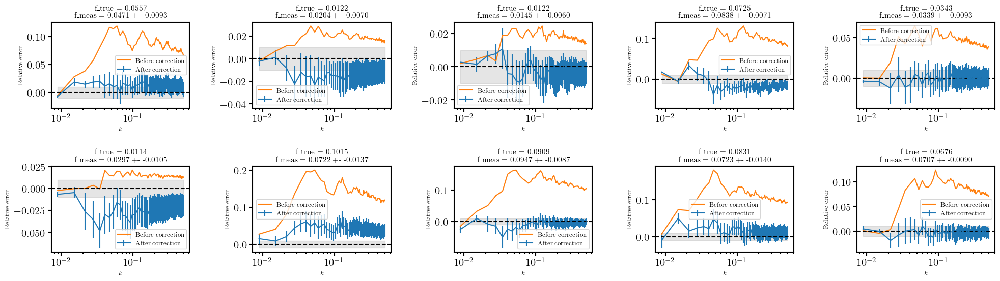

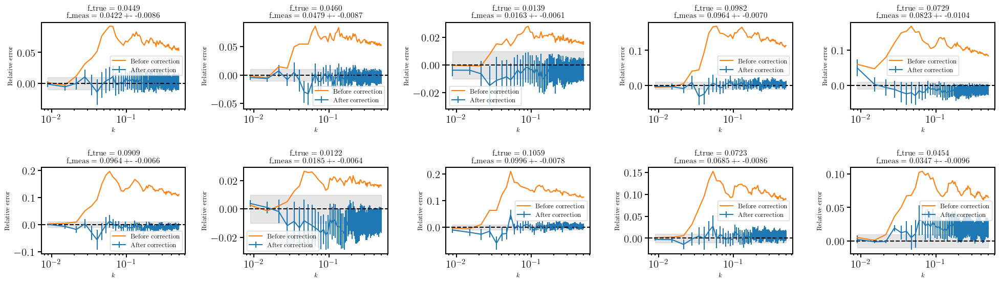

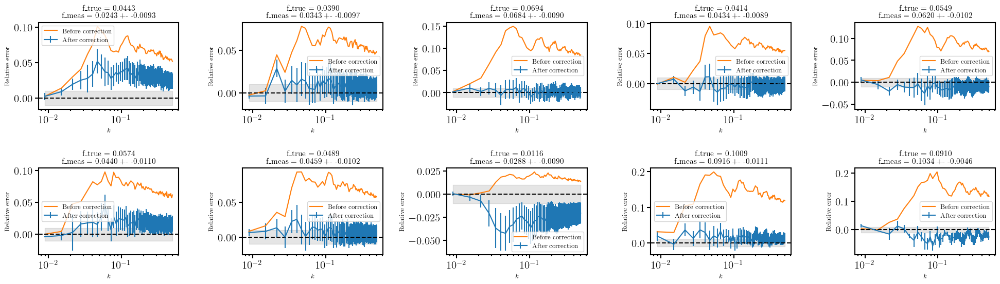

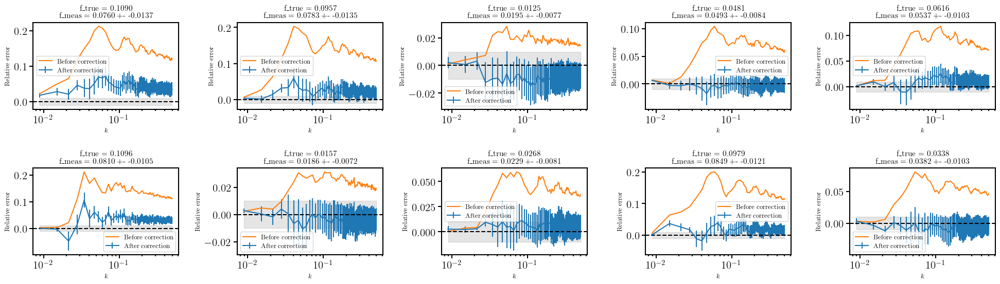

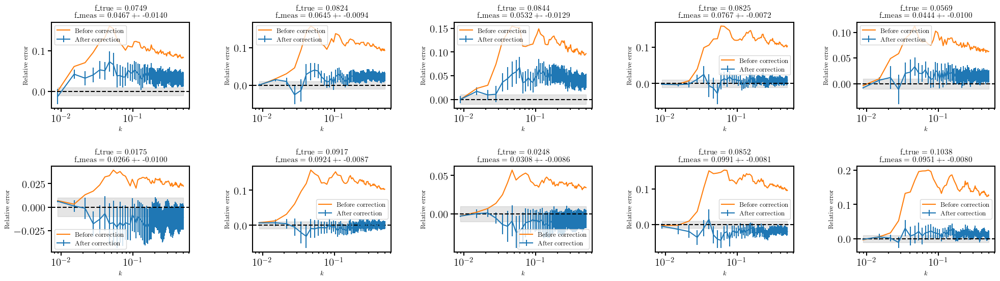

In [51]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenk, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

## P0 B0 -> P0

### 0 Planck

In [52]:
PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv(".inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 0. #0 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 0. #0 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


FileNotFoundError: [Errno 2] No such file or directory: '.inbox_all-fs-RSD-LH.csv'

1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/trained-models/../interlop-src/NoInterNet_model.py:203: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict

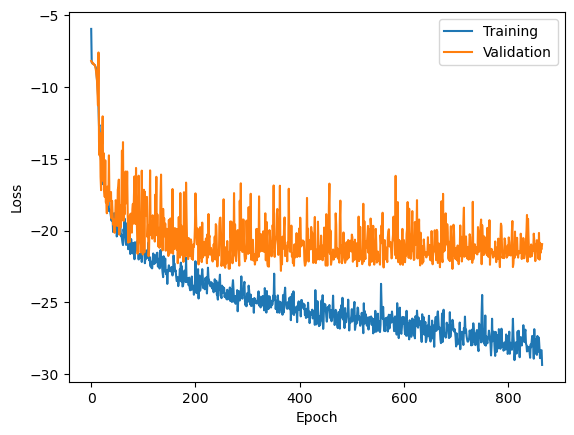

In [ ]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior0P-allshift-moments/")

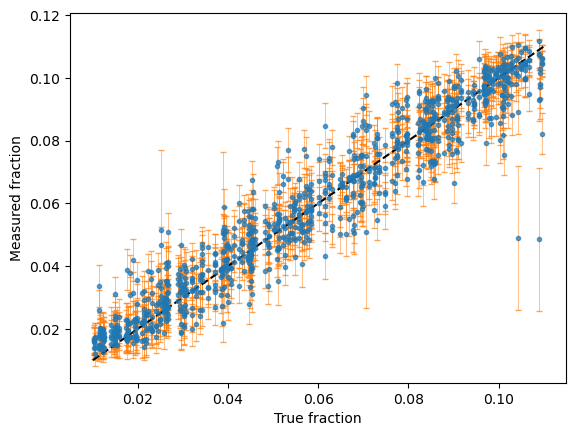

MSE error: 6.148341e-05


In [ ]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True, save=None)

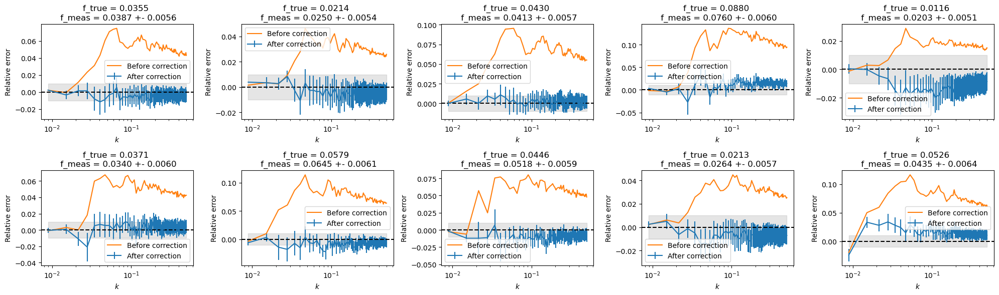

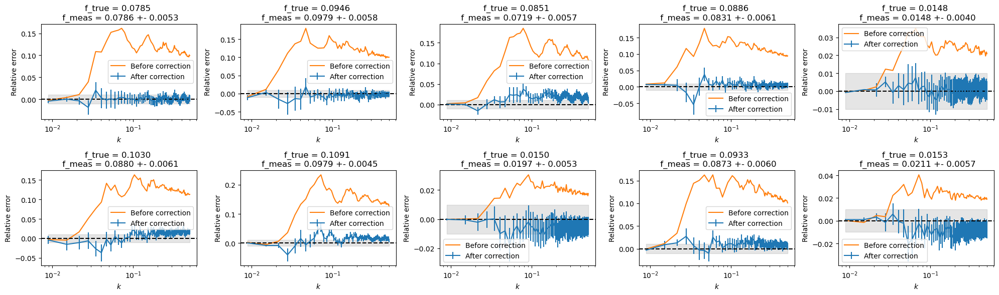

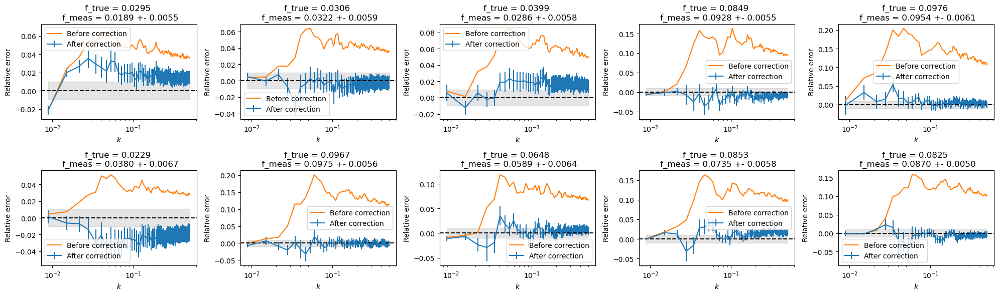

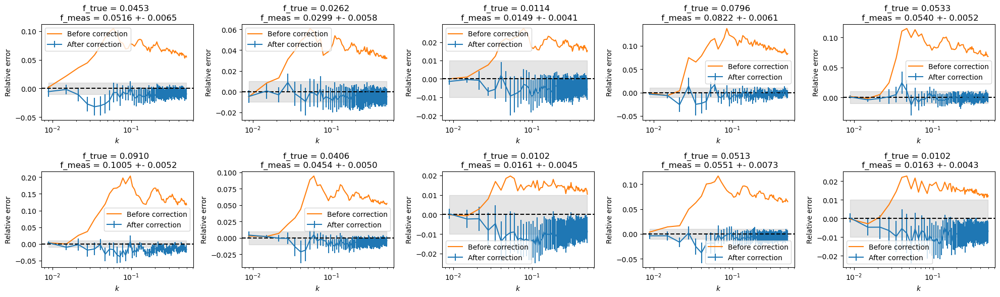

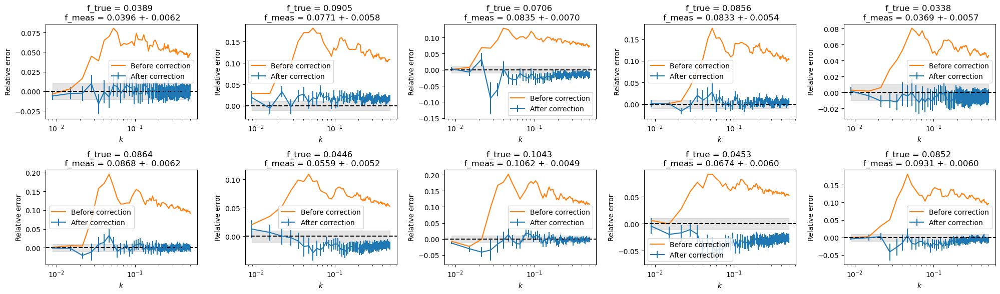

In [ ]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 5 Planck

In [ ]:
PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 5. #5 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 5. #5 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

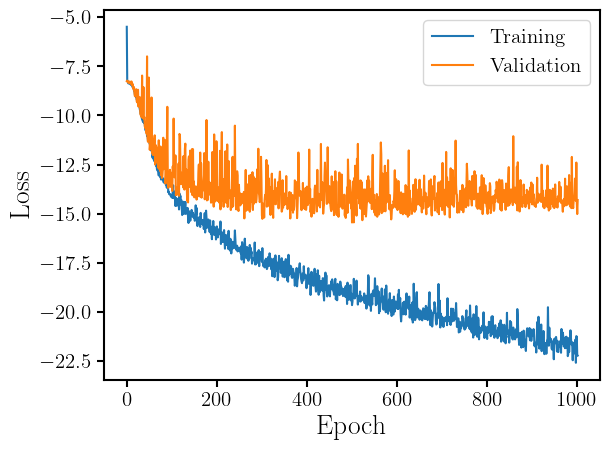

In [ ]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior5P-allshift-moments/")

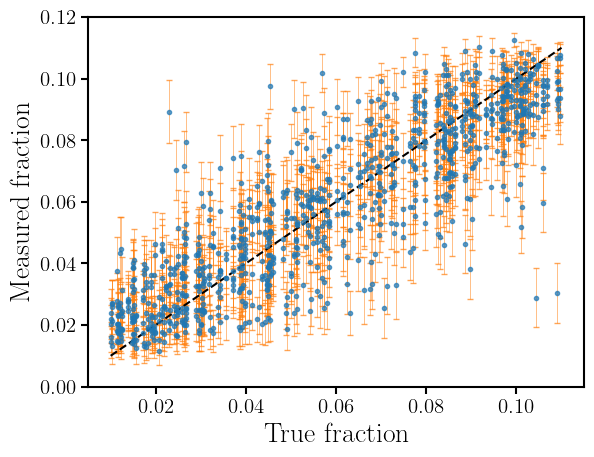

MSE error: 0.00021987804


In [ ]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True, save=None)

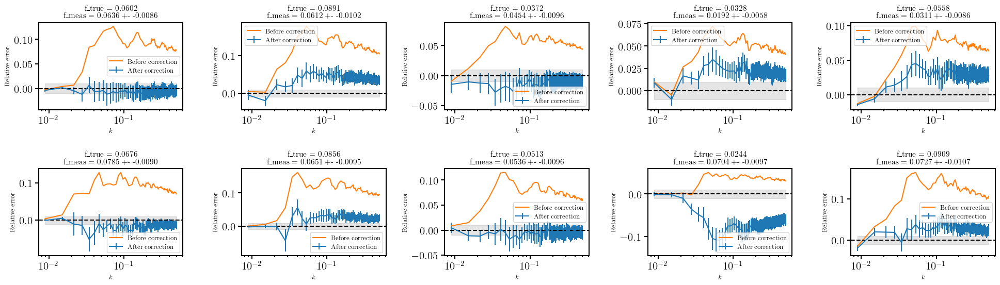

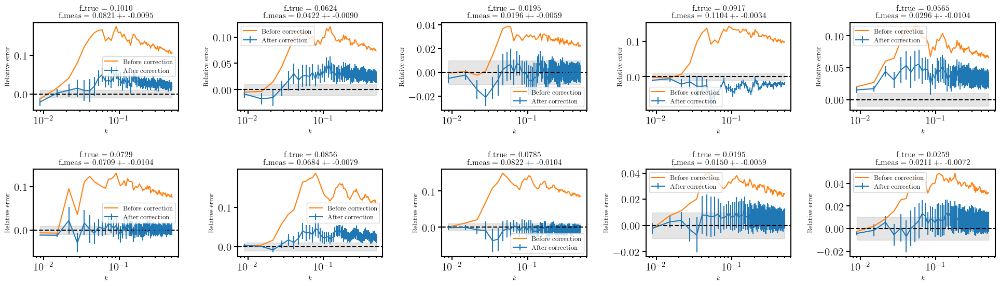

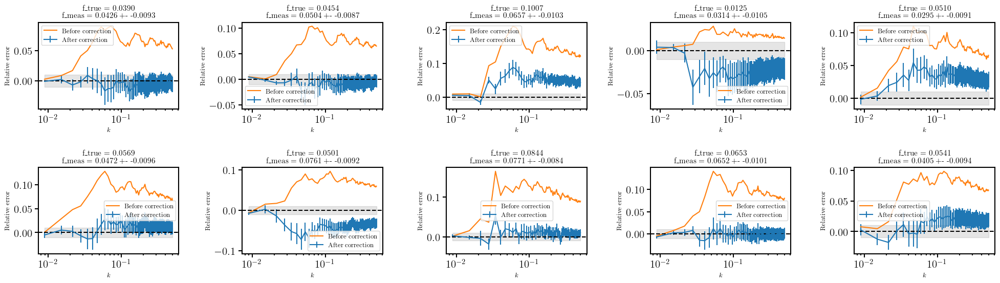

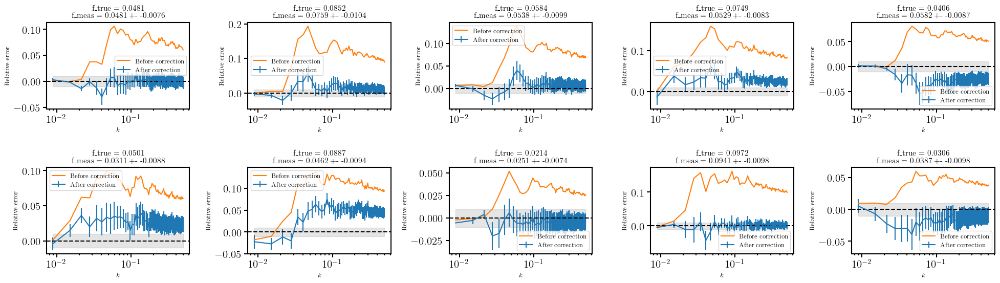

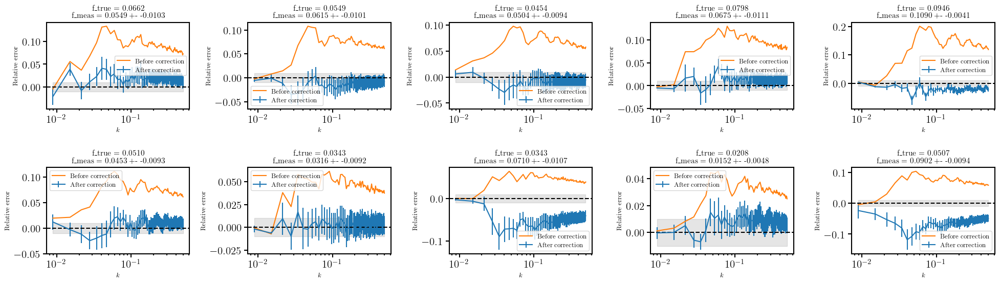

In [ ]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 3 Planck

In [ ]:
PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 3. #3 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 3. #3 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

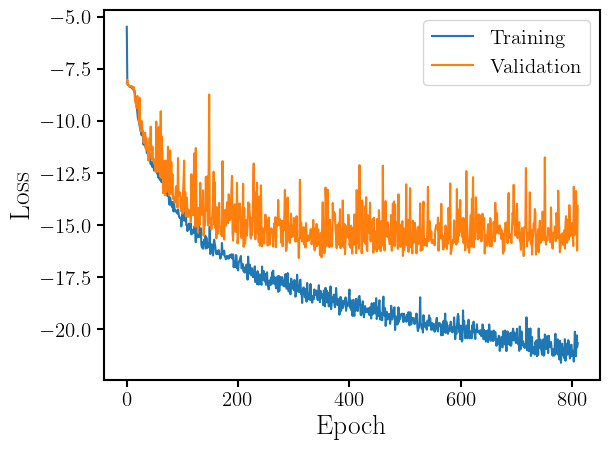

In [ ]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior3P-allshift-moments/")

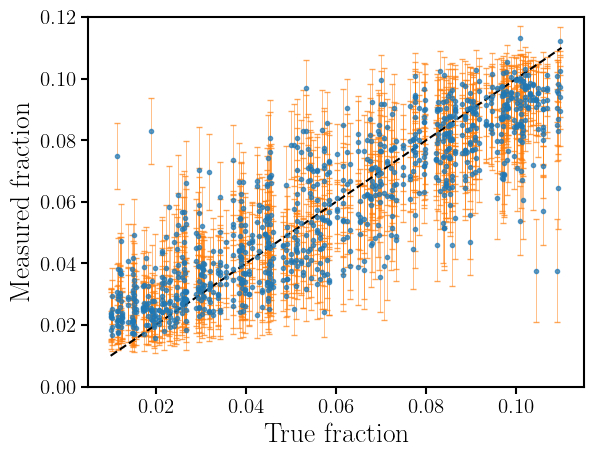

MSE error: 0.00020800775


In [ ]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True, save=None)

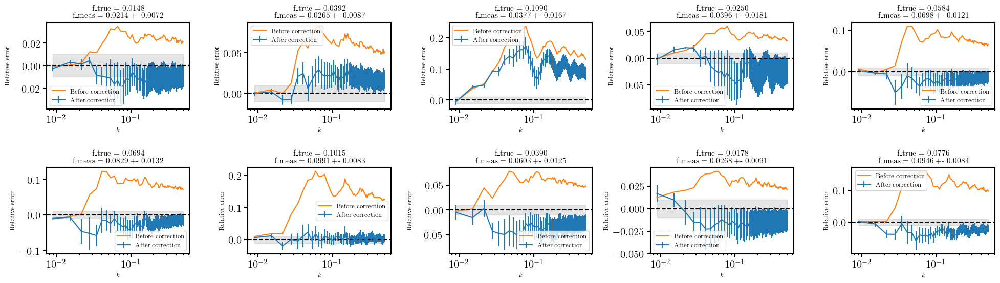

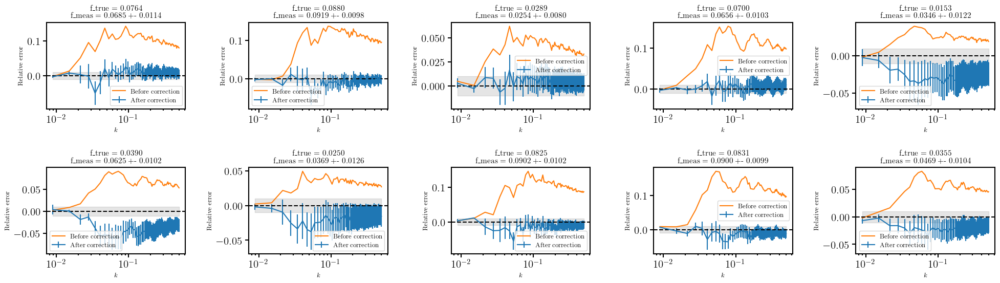

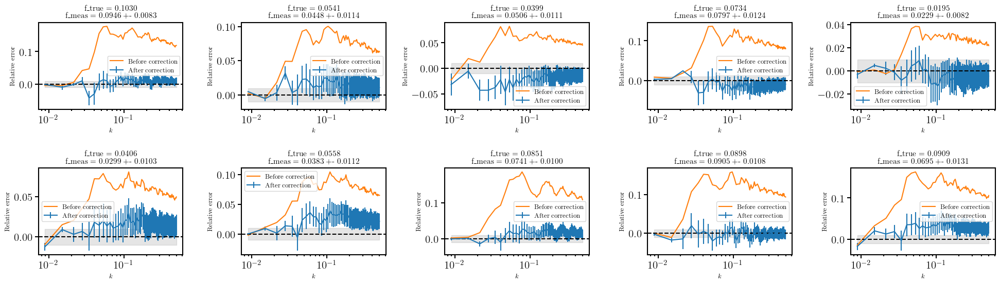

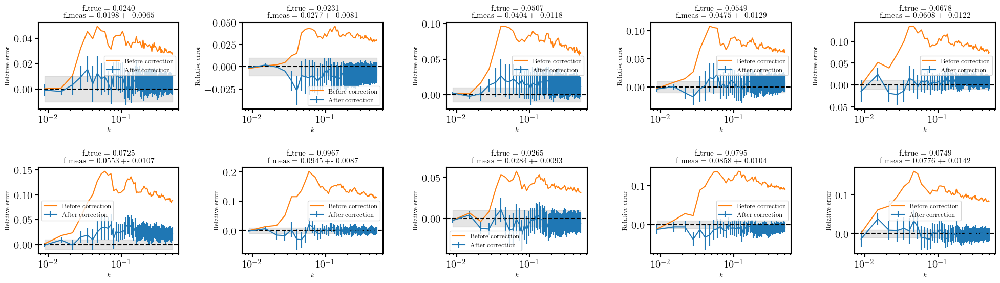

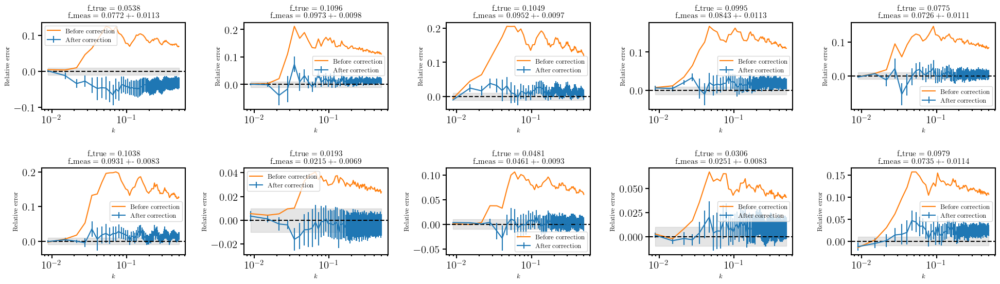

In [ ]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)

### 1 Planck

In [ ]:
PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True)
print(lenP, lenB)
max_corr = labels[:,:-1].max(axis=0)
min_corr = labels[:,:-1].min(axis=0)

PBs, labels, lenP, lenB = NINf.load_PBf("inbox_all-fs-RSD-LH.csv", "fractions-LH.txt", k_max=.5, log=False, norm_fs=True, norm_c=True)

##Priors
Pk_paths = pd.read_csv("inbox_all-fs-RSD-LH.csv")

sP = {'sigma_8': 0.0060, 'Omega_m': 0.0056, 'h': 0.0042, 'n_s': 0.0038, 'Omega_b': 0.0008} #from Table 2 in Planck 2018 (1807.06209)
priors = ['Omega_m', 'Omega_b', 'h', 'n_s', 'sigma_8']
len_priors = len(priors)
r = np.random.normal(size=(len(Pks), len_priors))
cosmo_p = np.zeros((len(Pks), len_priors))

for i, prior in enumerate(priors):
    if len_priors == 1:
        cosmo_p = np.reshape(Pk_paths[prior],((len(Pks),1))) + r * sP[prior] * 1. #1 times Planck
    else:
        cosmo_p[:,i] = Pk_paths[prior] + r[:,i] * sP[prior] * 1. #1 times Planck

PBs = np.hstack((PBs, cosmo_p)) #I also normalize cosmo_p between 0 and 1
#Loading max min

min_PBs, max_PBs = np.loadtxt("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/maxmin.dat", unpack=True)
PBs = NINf.maxmin_corr(PBs, max_PBs, min_PBs)
norm = np.ones(len(PBs))

fs = labels[:,-1]

_, ind = np.unique(fs, return_index=True)
f_u = np.array([fs[indx] for indx in sorted(ind)]) #non ordered unique interloper fraction array

n_train = int(len(f_u)*0.75)
n_val = int(len(f_u)*0.9)

fs_test = (f_u[n_val:])

sel_test = np.array([], dtype=int)

for f in fs_test: sel_test= np.append(sel_test, np.where(fs == f)[0])

PBs_test = PBs[sel_test]
labels_test = labels[sel_test]

norm_test = np.array(norm[sel_test, np.newaxis])

test = NIN.PkDataset(PBs_test, labels_test, norm_test)

test_batch = 10
test_dataloader = DataLoader(test, batch_size=test_batch, shuffle=True)


79 294


1 64 32
2 32 16
3 16 32
4 32 64


/home/cagliari/Documents/Work/LAPTh/interloper-Pk/NoInterNet/notebooks/../src/training/NoInterNet_model.py:200: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_stat

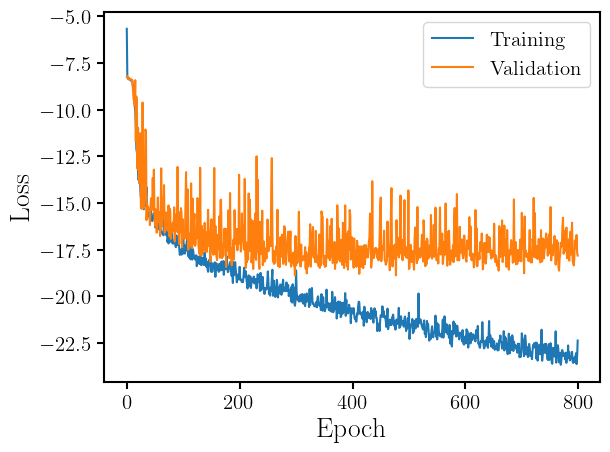

In [ ]:
model = NINf.NoInterNet_fraction_compress_inference(lenP+lenB+5, 64, lenP, 64, n_min=16).to(device)
NIN.resume(model, "../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/best_model-64.pth", device)

plot_history("../trained-model/LH/RSD/inbox-90.00/NoInterNet-Logloss-P0B0-P0-allprior1P-allshift-moments/")

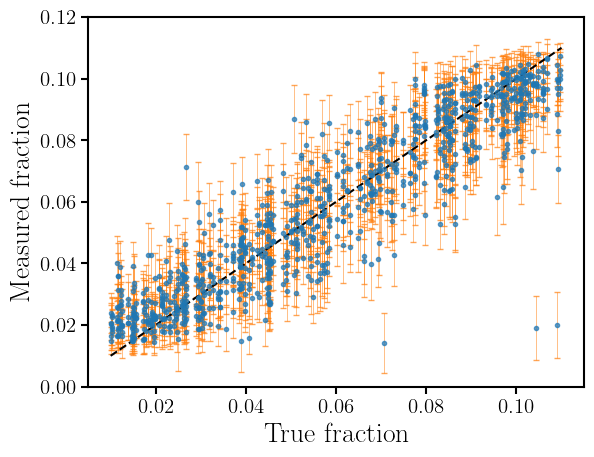

MSE error: 0.00013301028


In [ ]:
plot_fraction(test, model, lenk=lenP, device=device, norm_fs=True, save=None)

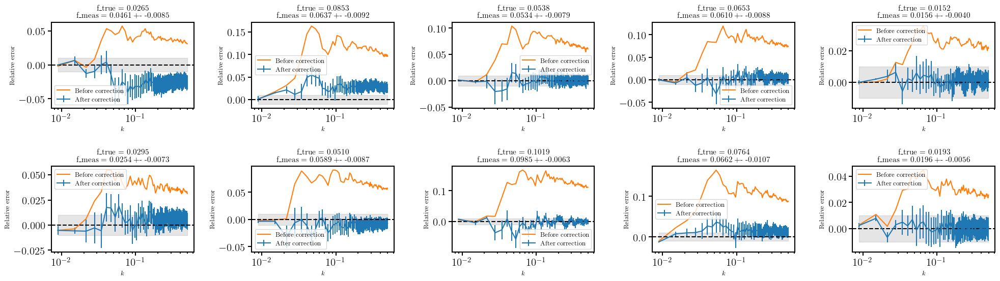

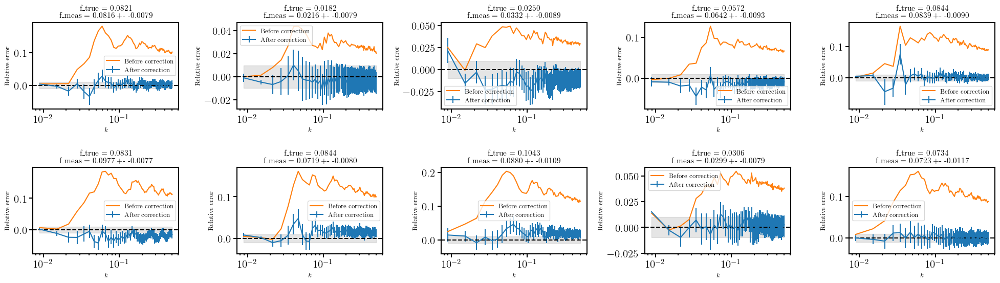

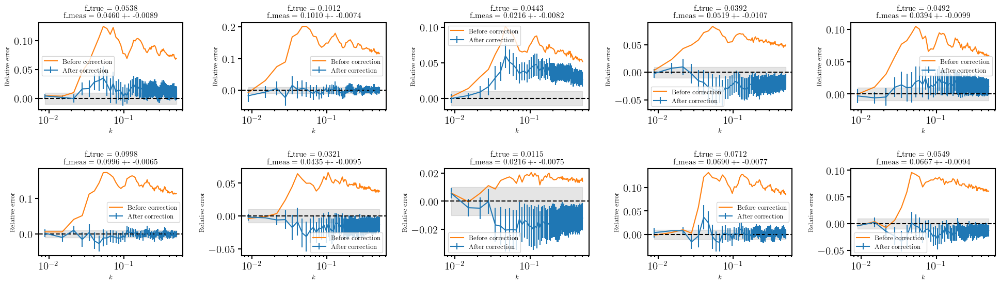

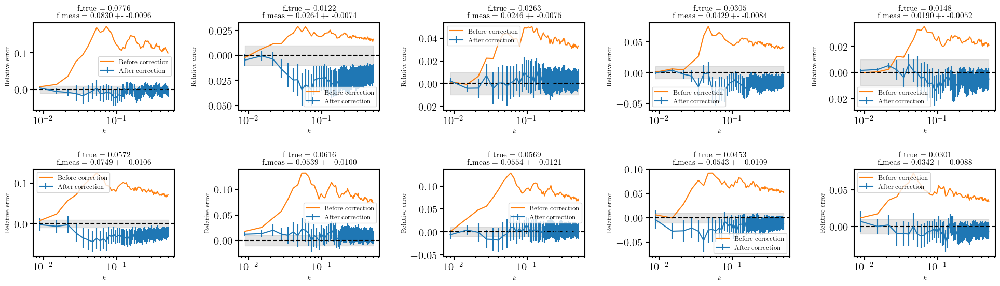

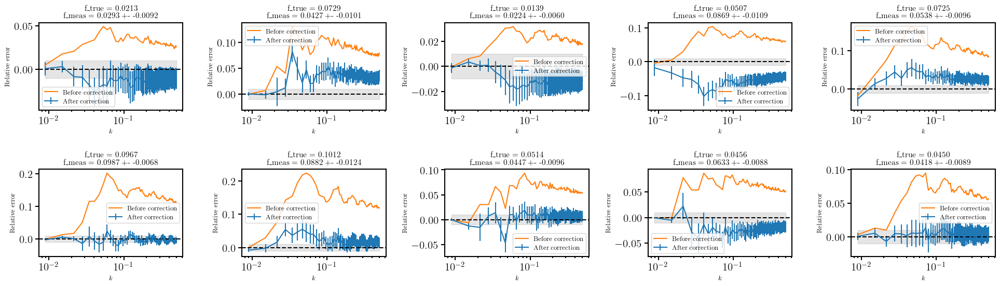

In [ ]:
ks = np.loadtxt('ks-gris.dat')

_ = plot_residual_error(test_dataloader, model, k_max=0.5, ks=ks, device=device, lenk=lenP, batch_test=10, N_batches=5, norm_fs=True, max_corr=max_corr, min_corr=min_corr)